**OpenBlas may create problems, see below before starting jupyter session**

In [ ]:
#!!!! May need to curb OpenBlas threads !!!! (Only once per session)
#export OMP_NUM_THREADS=1 (run directly in command line, not from jupyter notebook)

# Markov chains for length bias quantification in scRNA-seq: a Colab demonstration

In this notebook, we illustrate a Markov chain approach for joint probabilistic description of technical and biological noise in scRNA-seq.

We implement a [conventional two-stage model](https://www.sciencedirect.com/science/article/pii/S0006349512007904?via%3Dihub) for the living cell dynamics. Unspliced mRNA transcripts are produced in geometric bursts. These unspliced transcripts are spliced, then degraded. After equilibration, the sequencing process starts, halting all biological processes. The cDNA library construction is a pure-birth process: it yields $Poisson(\lambda_u)$ *in silico* UMIs for each unspliced mRNA and $Poisson(\lambda_s)$ UMIs for each spliced mRNA.

We use a length-dependent model of UMI capture. Specifically, we posit that $\lambda_u = C_u L$, where $L$ is the length of the full gene: longer genes have more poly(A) stretches that can be captured by the oligo(dT) primers used in scRNA-seq. On the other hand, $\lambda_s$ is presumed constant across all genes: spliced transcripts are primarily captured at the poly(A) tail appended before nuclear export.

We scan over a grid of $\{C_u, \lambda_s\}$ values, compute the conditional maximum likelihood estimates for the biological parameters, identify a sampling parameter optimum, and investigate parameter trends and fit quality. 

In [1]:
from datetime import date
import time
t1 = time.time()

## Prerequisites

First, install the necessary numerical differentiation, parallelization, and `loom` file import packages.

In [ ]:
# !pip -q install numdifftools 
# !pip -q install parfor
# !pip -q install loompy

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
#Clone project repository
!git clone https://github.com/tarachari3/GP_2021_3.git
!mv GP_2021_3/* .
#!rm -r seq-cme-technoise
!mv polyA_ref/* .

In [4]:
# Can add this function later to seq_cme_inference
# Write input txt file

def genRunInput(fname='example_input.txt',dataDir = './',outDir='./',loomName = '',tranName = '',polyaA='15',tInd='0',
                filt='0.01, 0.01, 350, 350, 3, 3',exclude='',attList="[['spliced','unspliced','Gene','Barcode']]",
                seed='42', nGenes='5000', ind='0', gList='', lb='-2, -1.8, -1.8', ub='4.2, 2.5, 2.5',
                restart='1',init='moments',length='True',niter='20',nCu='10',nlambda='11',
                lbSamp='-9, -4',ubSamp='-4, 1.5',suffix='1',creator='tc',ncor='20',override=''):
    '''
    Generate run file for CME inference procedure. 
    Parameters listed in order of appearance in run text file.
    For a dry-run set ind = '-1'.

    Parameters:
    fname: filepath for run file
    dataDir: filepath for data directory
    outDir: filepath for output directory
    loomName: loom filenames
    tranName: transcriptome filepath
    polyaA: min polyA count
    tInd: column of transcriptome file (lengths if 0, polyA count if 1)
    filt: min threshold for mean, max threshold for max, mean threshold for max; odd is U, even is S
    exclude:  result files (with genes to exclude)
    attList: list of lists for loom attribute names
    seed: gene selection seed
    nGenes: number of genes to select
    ind: loom file to analyze
    gList: result files to use for gene names
    lb: log10 of lower bound on burst size, splice rate, degradation rate
    ub: upper bound on on burst size, splice rate, degradation rate
    restart: how many times to run the search for each gene
    init: method to start search; 'random' if nothing
    length: use gene length for Poisson sampling
    niter: max iterations of gradient descent
    nCu: number of C_u points to evaluate
    nlambda: number of lambda_s points to evalute
    lbSamp: lower limits of C_u and lambda_s
    ubSamp: upper limits of C_u and lambda_s
    suffix: folder directory suffix
    creator: directory creator name
    ncor: number of cores to use
    override: if empty, use today's date from computer, else use string provided

    Returns:
    Run file (txt)
    '''

    with open(fname, 'w') as f:
        f.write('#Parameter input for CME inference ')
        f.write('\n')
        f.write('dataset_directory : '+dataDir+' : folder with dataset loom files')
        f.write('\n')
        f.write('result_directory : '+outDir+' : where to put the result folder')
        f.write('\n')
        f.write('loom_filenames : '+loomName+' : filenames to integrate')
        f.write('\n')
        f.write('transcriptome_filename : '+tranName+' : transcriptome location')
        f.write('\n')
        f.write('polyA_threshold : '+polyaA+' : minimum polyA count to use for sampling function')
        f.write('\n')
        f.write('transcriptome_ind : '+tInd+' : column of transcriptome file to use (lengths if 0, polyA count if 1)')
        f.write('\n')
        f.write('filter_param : '+filt+' : min threshold for mean, max threshold for max, mean threshold for max; odd is U, even is S')
        f.write('\n')
        f.write('all_prev_results : '+exclude+': result files with gene names to exclude')
        f.write('\n')
        f.write('attribute_names : '+attList+' : list or list of lists with loom attribute names')
        f.write('\n')
        f.write('gene_sel_seed : '+seed+' : gene selection seed')
        f.write('\n')
        f.write('n_gen : '+nGenes+' : number of genes to select')
        f.write('\n')
        f.write('IND : '+ind+' : loom_filename to analyze')
        f.write('\n')
        f.write('gene_list : '+gList+' : set of result files to import to define gene names')
        f.write('\n')
        f.write('phys_lb : '+lb+' : log10 of lower bound on burst size, splice rate, degradation rate')
        f.write('\n')
        f.write('phys_ub : '+ub+' : upper bound on same')
        f.write('\n')
        f.write('search_restarts : '+restart+' : how many times to run the search for each gene')
        f.write('\n')
        f.write("init_pattern : "+init+" : whether to start the search using method of moments estimate or not; 'random' if not")
        f.write('\n')
        f.write('use_lengths : '+length+' : whether the Poisson sampling for unspliced mRNA should depend on gene length')
        f.write('\n')
        f.write('maxiter : '+niter+' : number of iterations of gradient descent to perform')
        f.write('\n')
        f.write('n_pt1 : '+nCu+' : number of C_u points to evaluate')
        f.write('\n')
        f.write('n_pt2 : '+nlambda+' : number of lambda_s points to evalute')
        f.write('\n')
        f.write('samp_lb : '+lbSamp+' : lower limits of C_u and lambda_s')
        f.write('\n')
        f.write('samp_ub : '+ubSamp+' : upper limits of C_u and lambda_s')
        f.write('\n')
        f.write('ID_suffix : '+suffix+' : folder directory suffix')
        f.write('\n')
        f.write('creator : '+creator+' : directory creator name, can also be used for generic metadata')
        f.write('\n')
        f.write('NCOR : '+ncor+' : number of cores to use')
        f.write('\n')
        f.write("date_override : "+override+": if empty, use today's date from computer. if not, use the given string")




In [5]:
# a e s t h e t i c s

#all
col_gold = [203/255,197/255,149/255]
col_gray = [116/255,112/255,113/255]
col_red = [212/255,107/255,75/255]

### SI figures
ms = 0.7
lw = ms
ms_fail = 1
alf = 0.3
alf_fail = 0.5
sifig_aesth = (ms,lw,ms_fail,alf,alf_fail)

### Body figures
ms = 2
lw = ms
ms_fail = 2
alf = 0.3
alf_fail = 0.8
msfig_aesth = (ms,lw,ms_fail,alf,alf_fail)

markerstyle = None

In [6]:
def import_precomputed_(filestring):
    #Import result.pickle file
    with open(filestring,'rb') as f:
        precomp = pickle.load(f)
    return precomp

def check_at_bounds(result_data,phys_params,thr=0.01):
    #Check for genes where parameter fits are close to boundary of grid
    x = np.any(np.logical_or(
        result_data.search_params.lb_log+thr > phys_params,
        result_data.search_params.ub_log-thr < phys_params) ,1)
    return x


def get_name(fname,iden="_20x21"):
    #Get all result files for run
    start = fname.find(data_path+proj_fold+out_fold+creator+'_'+override+'_') + len(data_path+proj_fold+out_fold+creator+'_'+override+'_')
    end = fname.find(iden)
    substring = fname[start:end]
    
    return substring

## Inference

Import the processing scripts.

In [7]:
from seq_cme_inference import *
from driver import *
from itertools import combinations
from matplotlib.colors import ListedColormap
import glob
import numpy as np
import pandas as pd

### **Set global variables**

In [8]:
data_path = '/home/tchari/counts/'

in_fold = 'loom/'
out_fold = 'loom_res/'

transcriptome = 'gg_200525_genome_polyA_cum_3'

#Dataset-dependent

#Dataset to select genes (smallest)
sml_loom = ['crisprsgNegCtrl02093a_sgNegCtrl3b']

# Only use neg control samples with >500 cells
control_looms =  ['crisprsgNegCtrl4a_sgNegCtrl3b','crisprsgNegCtrl8a_sgNegCtrl3b',
'crisprsgNegCtrl5a_sgNegCtrl3b','crisprsgNegCtrl1a_sgNegCtrl3b','crisprsgNegCtrl9a_sgNegCtrl3b',
                 'crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b'] 

control_combo_loom = ['crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b']
#STUDY uses sgNegCtrl4a_sgNegCtrl3b  only as control

perturb_looms = ['crisprsgHUS1_2a_sgFDPS_2b',
         'crisprsgHUS1_2a_sgNegCtrl3b','crisprsgNegCtrl02093a_sgFDPS_2b']  #Maybe change to sgHUS1_2a_sgFDPS_2b, sgNegCtrl02093a_sgFDPS_2b

proj_fold = 'replogle_crispr/'   

override='220426' #'220324'

creator = 'tc'

In [9]:
selGenes = creator+'_'+override+'_selected_genes.csv'
filtGenes = creator+'_'+override+'_filtered_genes.csv'

In [ ]:
!mkdir {data_path+proj_fold+out_fold}

### **Conduct gene selection and sampling parameter fitting across a set of combined Negative Controls**
Selected negative controls with >500 cells 

In [22]:
genRunInput(fname=control_combo_loom[0]+'_input.txt',dataDir =data_path+proj_fold+in_fold,
            outDir=data_path+proj_fold+out_fold,loomName = control_combo_loom[0],nCu='20',nlambda='21',
            restart='5', niter='40',
            attList= "[['spliced','unspliced','Gene','Barcode']]", tranName = transcriptome,override=override)

In [23]:
!cat {control_combo_loom[0]+'_input.txt'}

#Parameter input for CME inference 
dataset_directory : /home/tchari/counts/replogle_crispr/loom/ : folder with dataset loom files
result_directory : /home/tchari/counts/replogle_crispr/loom_res/ : where to put the result folder
loom_filenames : crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b : filenames to integrate
transcriptome_filename : gg_200525_genome_polyA_cum_3 : transcriptome location
polyA_threshold : 15 : minimum polyA count to use for sampling function
transcriptome_ind : 0 : column of transcriptome file to use (lengths if 0, polyA count if 1)
filter_param : 0.01, 0.01, 350, 350, 3, 3 : min threshold for mean, max threshold for max, mean threshold for max; odd is U, even is S
all_prev_results : : result files with gene names to exclude
attribute_names : [['spliced','unspliced','Gene','Barcode']] : list or list of lists with loom attribute names
gene_sel_seed : 42 : gen

['/home/tchari/counts/replogle_crispr/loom/crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b.loom']
Beginning preprocessing routine:
Dataset: /home/tchari/counts/replogle_crispr/loom/crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b.loom
36601 features observed, 36169 match genome annotations. 35727 are unique. 
4563 cells detected.
9923 genes retained as high-expression.
2338 genes retained in loom structure based on filter.
Gene set size: 2338
-----------
2338 genes selected: cannot satisfy query of 5000 genes.
Gene set selected!
Beginning search routine.
36601 features observed, 36169 match genome annotations. 35727 are unique. 
4563 cells detected.
Directory /home/tchari/counts/replogle_crispr/loom_res/tc_220419_crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtr

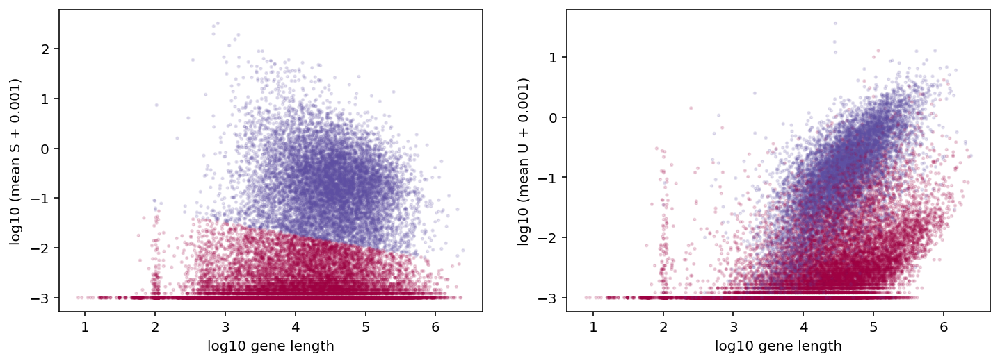

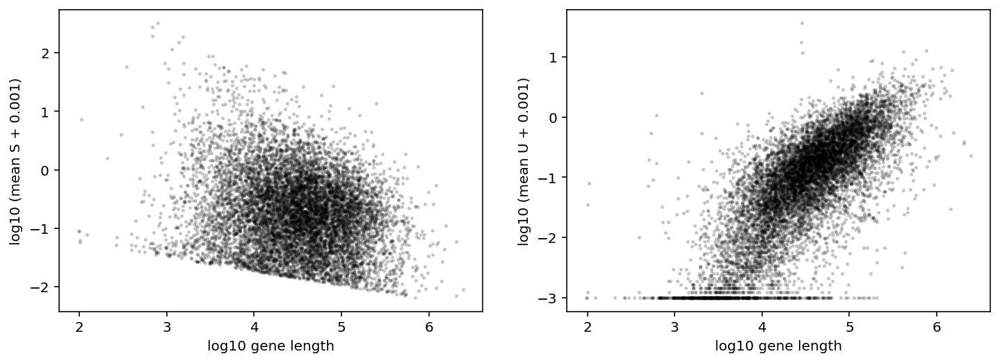

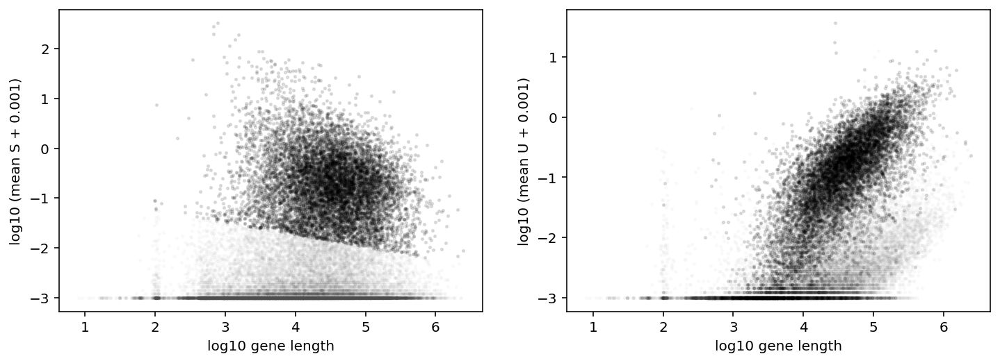

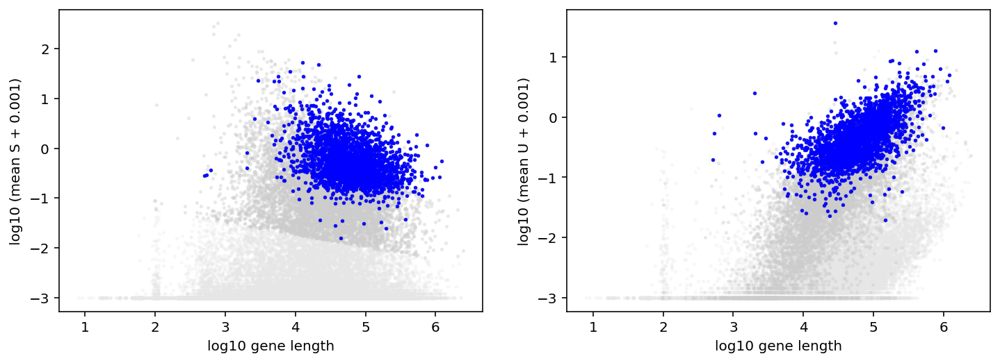

In [24]:
inference_workflow(control_combo_loom[0]+'_input.txt')
#output looks ok, clear separation between high and low count genes

### **Assess best sampling parameters with chi-squared rejection of genes**
Using a chi-squared test reject genes with poor fits and determine the best sampling and physical parameters upon removal of these genes

In [13]:
outputs = glob.glob(data_path+proj_fold+out_fold+creator+'_'+override+'_*/result.pickle')

In [27]:
out_names = [get_name(i) for i in outputs]
out_names

['crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b']

In [28]:
#Read in outputs
results = []
for i in outputs:
     results += [import_datasets([i])]

results[0].raw_S.shape

(2338, 4563)

#### **Do chi-squared correction (reject genes with bad fits) and re-evaluate best params**

crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b


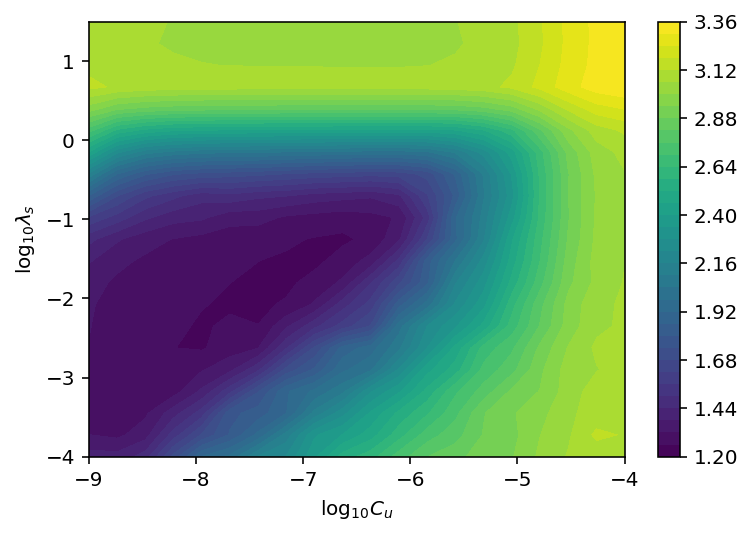

In [29]:
#### **Do chi-squared correction (reject genes with bad fits) and re-evaluate best params**
for i in range(0,len(results)):
    print(out_names[i])
    landscape_viz(results[i])

In [30]:
#Run chisq, set rejected genes

#Set some optimal samp params before chisq
for i in range(0,len(results)):
    results[i].find_best_params() 
    print(results[i].best_samp_params)
 

(-6.894736842105264, -1.525)


0


/home/tchari/perturbCME/notebooks/seq_cme_inference.py:382: RuntimeWarning: invalid value encountered in sqrt
  errorbars[i,:] = c*np.sqrt(np.diag(hess_inv))/np.sqrt(result_data.Ncells)


Parameter set 177 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 619 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 720 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 753 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 951 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 1522 gives negative stdev; replaced with mean. (Search converged to local minimum?)


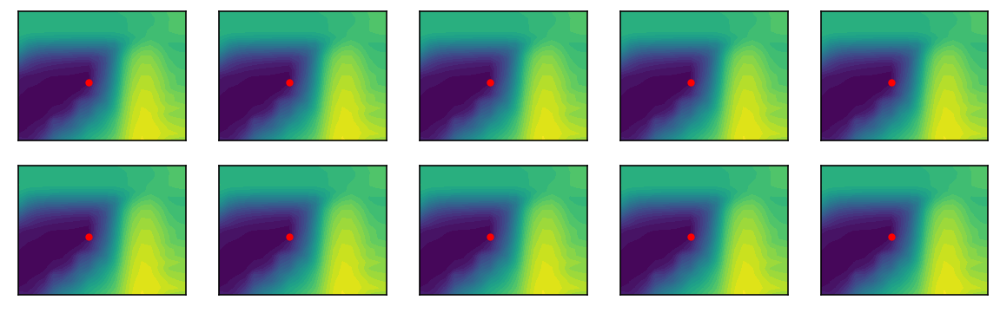

In [19]:
#Run chisq, set rejected genes
 
for i in range(0,len(results)):
    print(i)
    chisq_gen(results[i],EPS=1e-20) #1e-12 too large --> numerical discrepancies b/w obs vs expect freqs
    compute_sigma(results[i])
    chisq_best_param_correction(results[i],overwrite=True,EPS=1e-20) #Copy github and change params

In [21]:
for i in range(0,len(results)): 
    print(out_names[i] + ' New params: ', results[i].best_samp_params)
    perc = np.round(np.sum(results[i].gene_rej)/results[i].n_gen,3)*100
    print(out_names[i]+': '+str(np.sum(results[i].gene_rej))+' genes of '+str(results[i].n_gen)+' ('+ str(perc)+'%) have been rejected by chi-square.')
    print()

crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b New params:  (-6.894736842105264, -1.525)
crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b: 218 genes of 2338 (9.3%) have been rejected by chi-square.



In [33]:
for i in range(0,len(results)):
    print(out_names[i]+' avg KL: '+str(np.mean(results[i].gene_spec_err[results[i].best_ind])))

crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b avg KL: 0.007532027044264655


#### **Look at parameters fits**

crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b


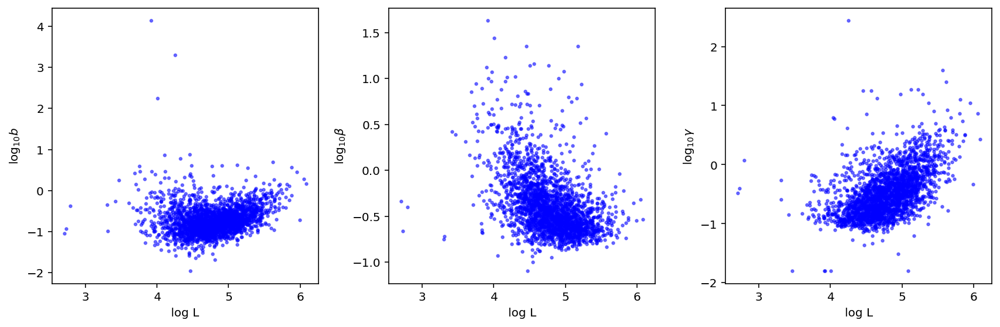

In [31]:
for i in range(0,len(results)):
    print(out_names[i])
    plot_param_L_dep(results[i],plot_errorbars=False,nosamp=True,chisq_correct=False)  #May see length dependence

crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b


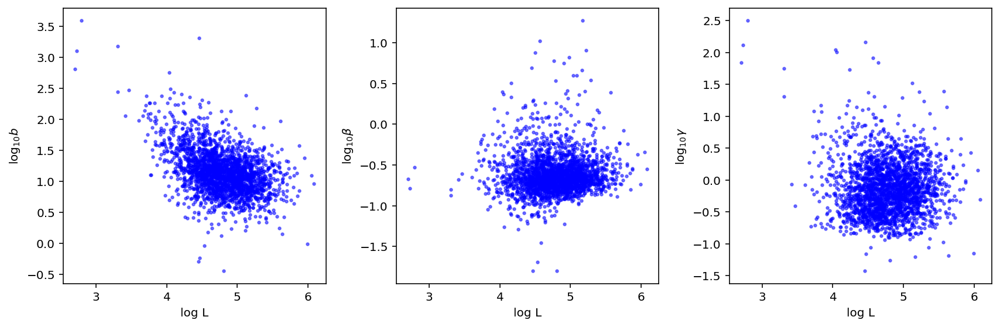

In [32]:
for i in range(0,len(results)):
    print(out_names[i])
    plot_param_L_dep(results[i],plot_errorbars=False,chisq_correct=False)  #Should not see length dep (besides burst size)

### **Repeat for each control and perturbed sample**
(1) Set selected genes for all fits from study's main control sample with 1x1 grid for samp parrams

(2) Set 1x1 grid with set sample params and fit params for selected genes only

### **Conduct gene selection and sampling parameter fitting for *each* sample**
Selected negative controls with >500 cells 

In [10]:
#Run control to set selected genes

#-6.894736842105264, -1.525
genRunInput(fname=sml_loom[0]+'_input.txt',dataDir =data_path+proj_fold+in_fold,
            outDir=data_path+proj_fold+out_fold,loomName =sml_loom[0], lbSamp='-6.894736842105264, -1.525',
            ubSamp='-6.894736842105264, -1.525',
            nCu='1',nlambda='1', restart='5', niter='40', ncor='40',
            attList= "[['spliced','unspliced','Gene','Barcode']]", tranName = transcriptome,override=override) #gList= selGenes+','+filtGenes,

['/home/tchari/counts/replogle_crispr/loom/crisprsgNegCtrl02093a_sgNegCtrl3b.loom']
Beginning preprocessing routine:
Dataset: /home/tchari/counts/replogle_crispr/loom/crisprsgNegCtrl02093a_sgNegCtrl3b.loom
36601 features observed, 36169 match genome annotations. 35727 are unique. 
1465 cells detected.
9962 genes retained as high-expression.
1595 genes retained in loom structure based on filter.
Gene set size: 1595
-----------
1595 genes selected: cannot satisfy query of 5000 genes.
Gene set selected!
Beginning search routine.
36601 features observed, 36169 match genome annotations. 35727 are unique. 
1465 cells detected.
Directory /home/tchari/counts/replogle_crispr/loom_res/tc_220426_crisprsgNegCtrl02093a_sgNegCtrl3b_1x1_1595gen_1 created; metadata written.
1 of 1 points to be evaluated.
Starting search...
Parallelization done!
Runtime: 6.6 min.


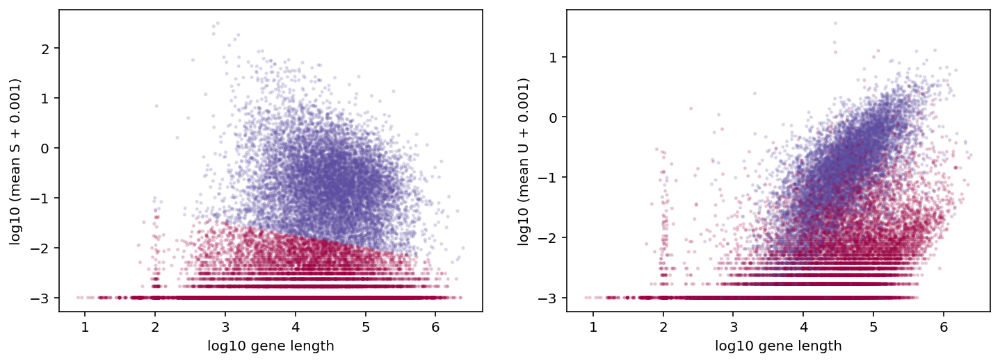

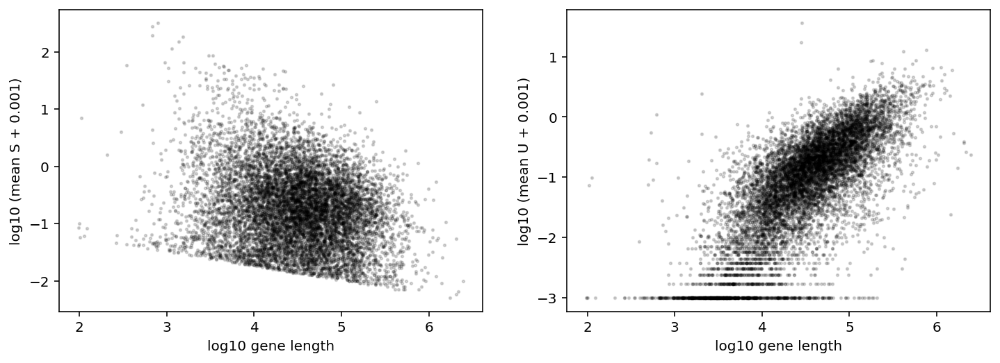

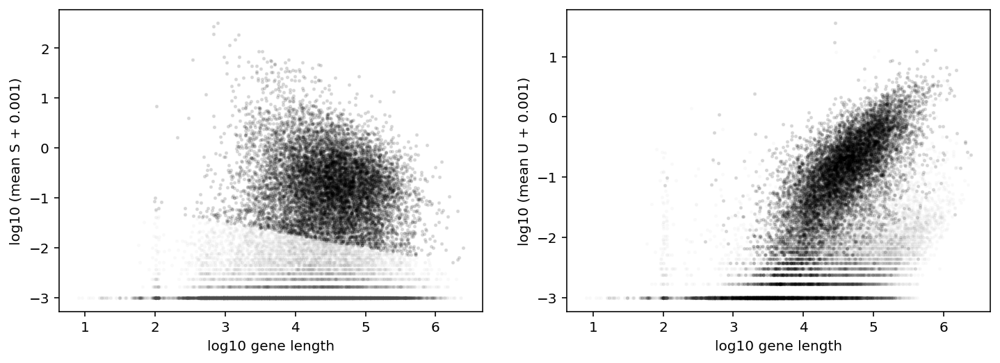

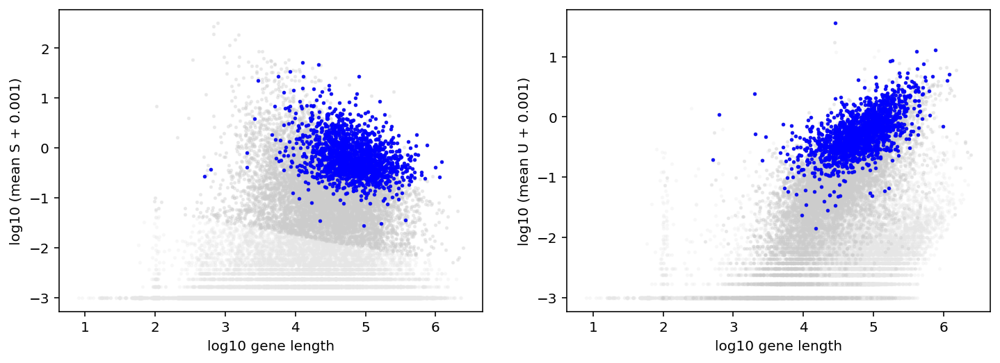

In [11]:
inference_workflow(sml_loom[0]+'_input.txt')

In [ ]:
#Run all other samples now

In [12]:
for i in range(0,len(control_looms)):
    genRunInput(fname=control_looms[i]+'_input.txt',dataDir =data_path+proj_fold+in_fold,
                outDir=data_path+proj_fold+out_fold,loomName = control_looms[i], lbSamp='-6.894736842105264, -1.525',
                ubSamp='-6.894736842105264, -1.525',
                nCu='1',nlambda='1', restart='5', niter='40', ncor='40', gList= selGenes+','+filtGenes,
                attList= "[['spliced','unspliced','Gene','Barcode']]", tranName = transcriptome,override=override) #gList= selGenes+','+filtGenes,

['/home/tchari/counts/replogle_crispr/loom/crisprsgNegCtrl4a_sgNegCtrl3b.loom']
Beginning search routine.
36601 features observed, 36169 match genome annotations. 35727 are unique. 
780 cells detected.
Directory /home/tchari/counts/replogle_crispr/loom_res/tc_220426_crisprsgNegCtrl4a_sgNegCtrl3b_1x1_1595gen_1 created; metadata written.
1 of 1 points to be evaluated.
Starting search...
Parallelization done!
Runtime: 6.1 min.
['/home/tchari/counts/replogle_crispr/loom/crisprsgNegCtrl8a_sgNegCtrl3b.loom']
Beginning search routine.
36601 features observed, 36169 match genome annotations. 35727 are unique. 
592 cells detected.
Directory /home/tchari/counts/replogle_crispr/loom_res/tc_220426_crisprsgNegCtrl8a_sgNegCtrl3b_1x1_1595gen_1 created; metadata written.
1 of 1 points to be evaluated.
Starting search...
Parallelization done!
Runtime: 5.9 min.
['/home/tchari/counts/replogle_crispr/loom/crisprsgNegCtrl5a_sgNegCtrl3b.loom']
Beginning search routine.
36601 features observed, 36169 match g

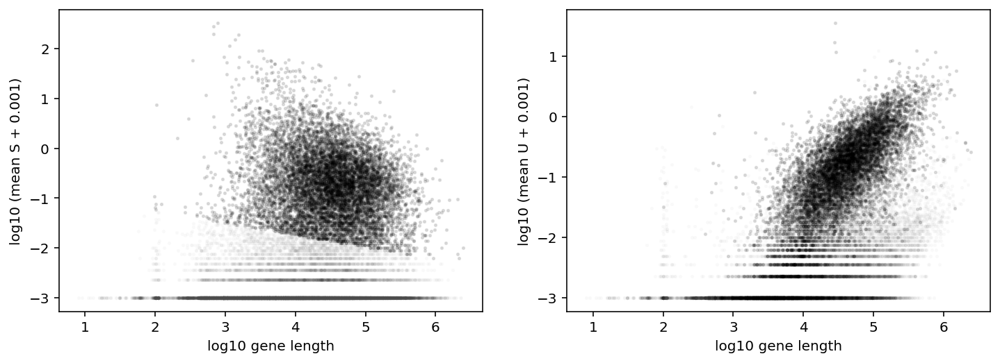

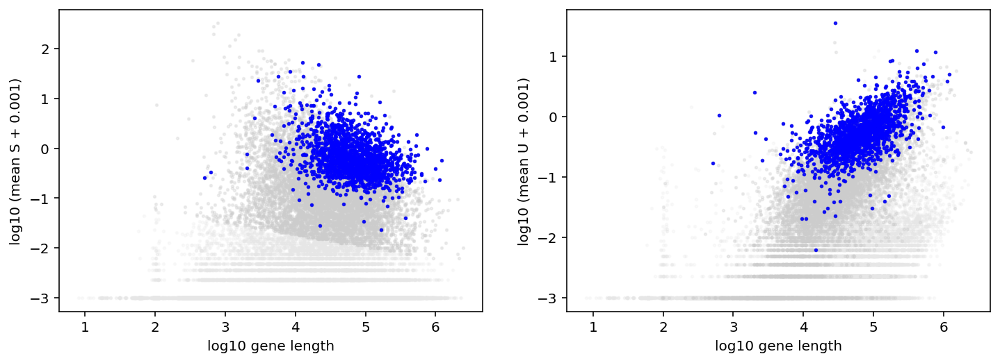

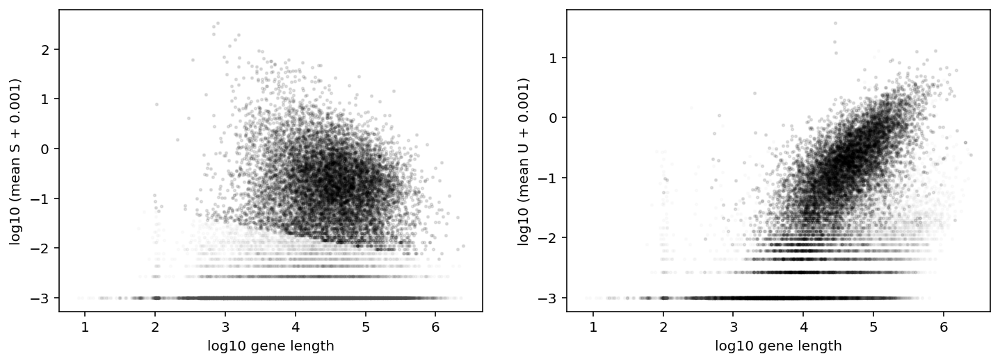

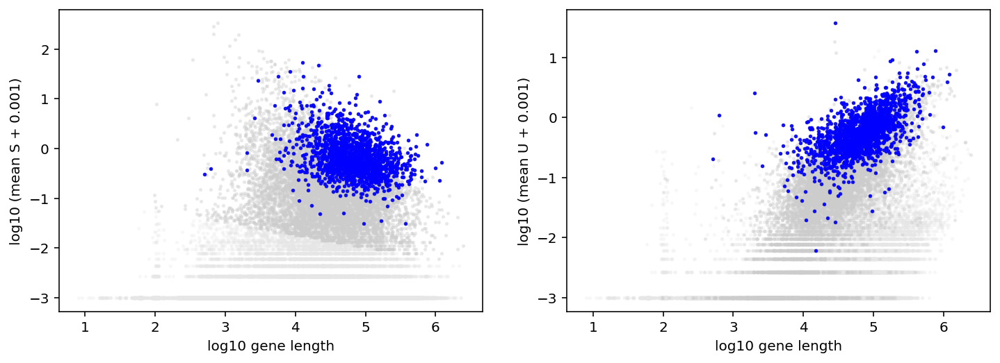

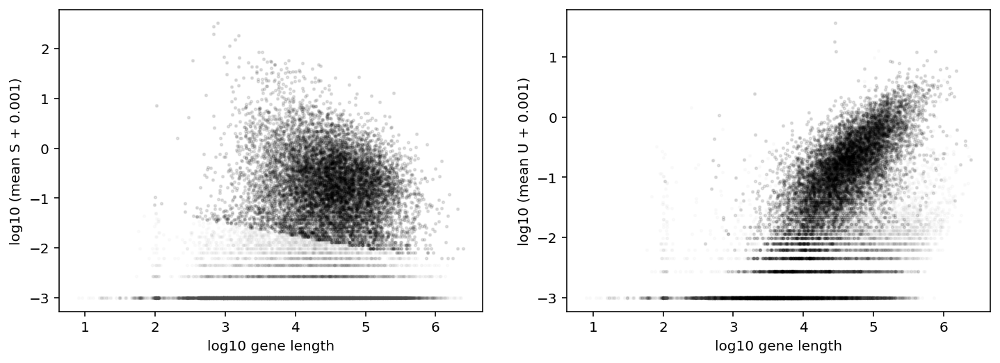

...

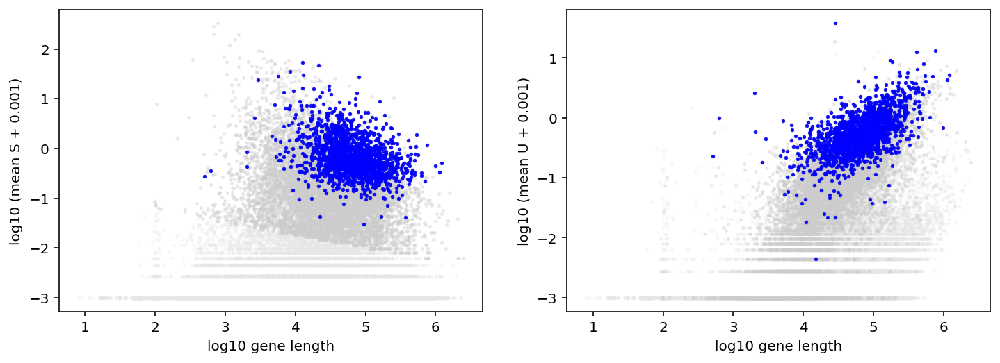

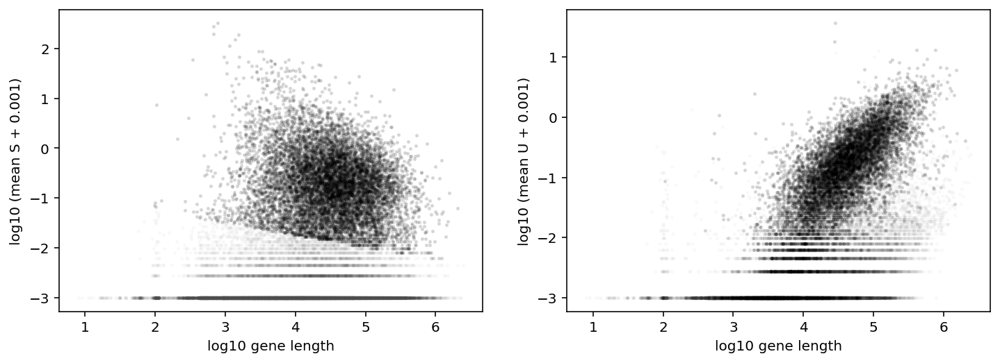

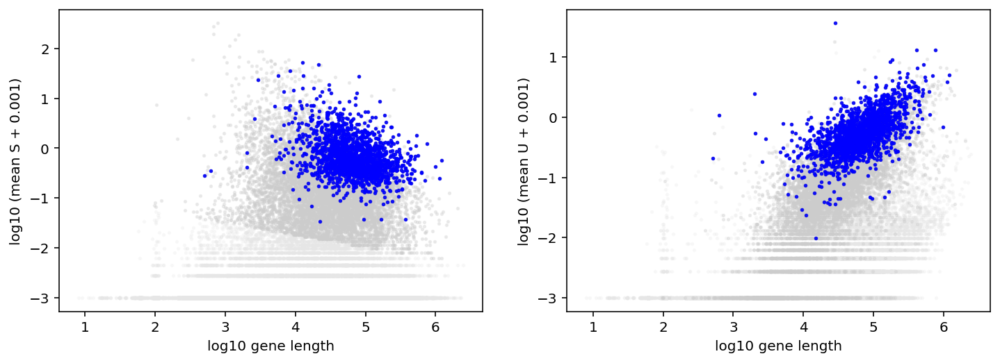

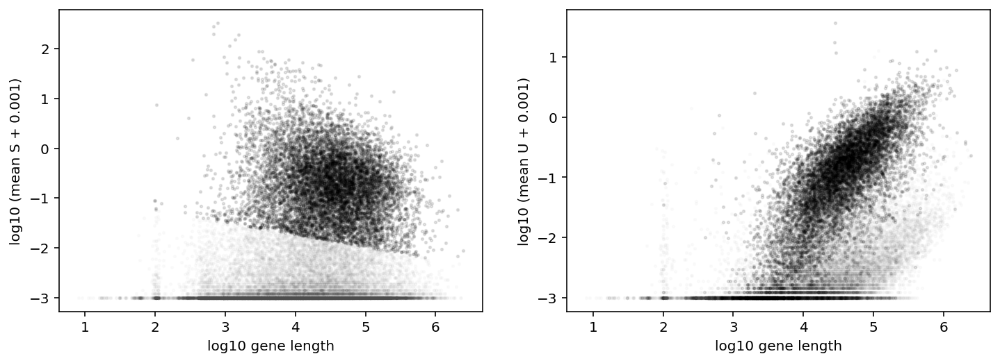

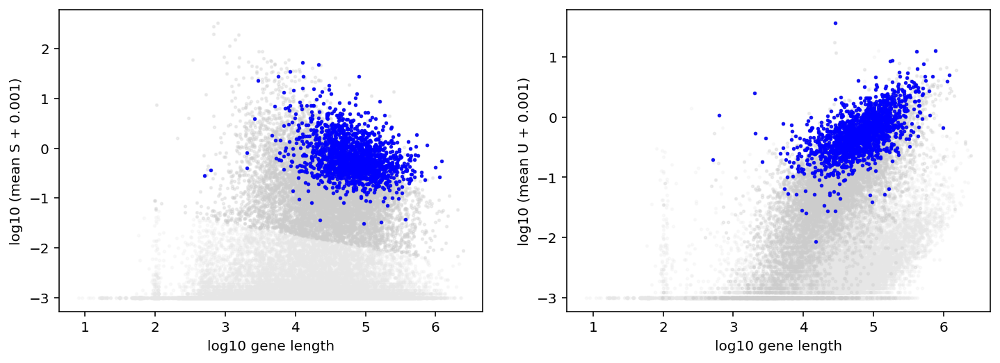

In [13]:
for i in range(0,len(control_looms)):
    inference_workflow(control_looms[i]+'_input.txt')

In [14]:
for i in range(0,len(perturb_looms)):
    genRunInput(fname=perturb_looms[i]+'_input.txt',dataDir =data_path+proj_fold+in_fold,
                outDir=data_path+proj_fold+out_fold,loomName = perturb_looms[i], lbSamp='-6.894736842105264, -1.525',
                ubSamp='-6.894736842105264, -1.525',
                nCu='1',nlambda='1', restart='5', niter='40', ncor='40', gList= selGenes+','+filtGenes,
                attList= "[['spliced','unspliced','Gene','Barcode']]", tranName = transcriptome,override=override) #gList= selGenes+','+filtGenes,

['/home/tchari/counts/replogle_crispr/loom/crisprsgHUS1_2a_sgFDPS_2b.loom']
Beginning search routine.
36601 features observed, 36169 match genome annotations. 35727 are unique. 
831 cells detected.
Directory /home/tchari/counts/replogle_crispr/loom_res/tc_220426_crisprsgHUS1_2a_sgFDPS_2b_1x1_1595gen_1 created; metadata written.
1 of 1 points to be evaluated.
Starting search...
Parallelization done!
Runtime: 6.0 min.
['/home/tchari/counts/replogle_crispr/loom/crisprsgHUS1_2a_sgNegCtrl3b.loom']
Beginning search routine.
36601 features observed, 36169 match genome annotations. 35727 are unique. 
905 cells detected.
Directory /home/tchari/counts/replogle_crispr/loom_res/tc_220426_crisprsgHUS1_2a_sgNegCtrl3b_1x1_1595gen_1 created; metadata written.
1 of 1 points to be evaluated.
Starting search...
Parallelization done!
Runtime: 6.0 min.
['/home/tchari/counts/replogle_crispr/loom/crisprsgNegCtrl02093a_sgFDPS_2b.loom']
Beginning search routine.
36601 features observed, 36169 match genome anno

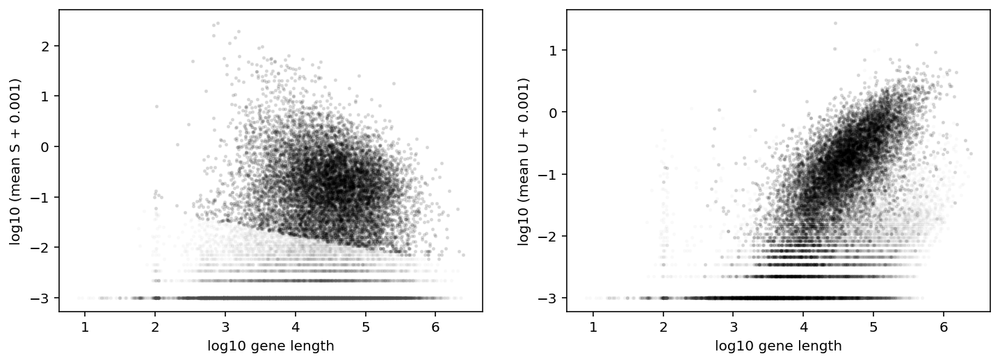

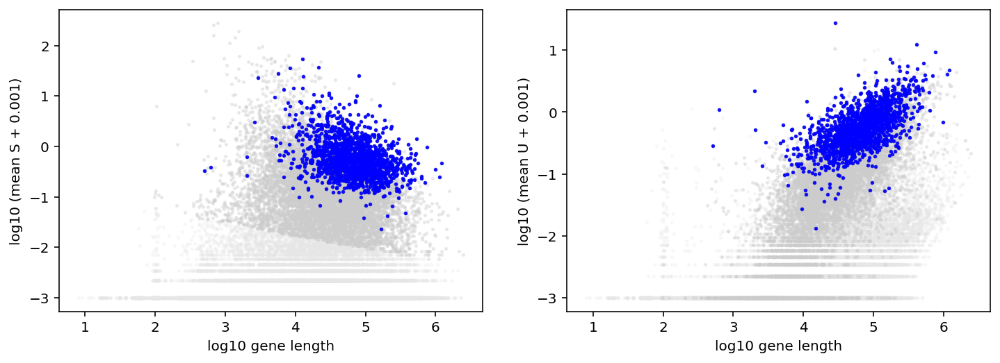

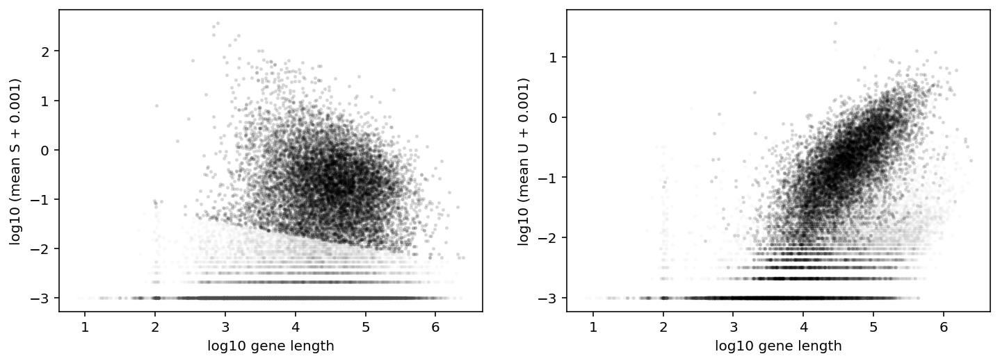

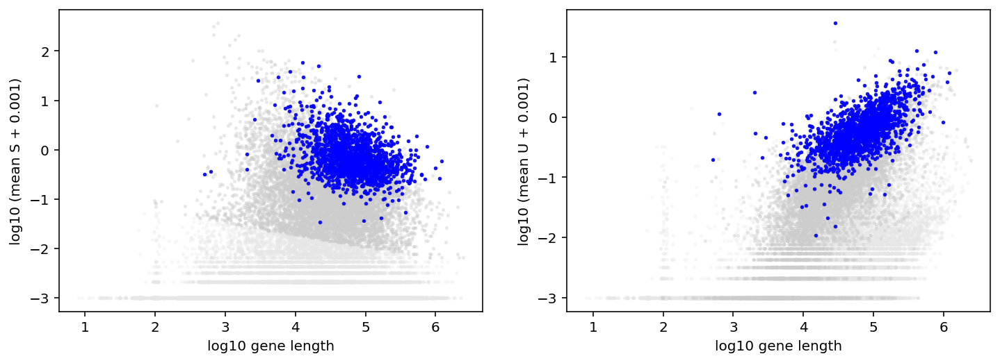

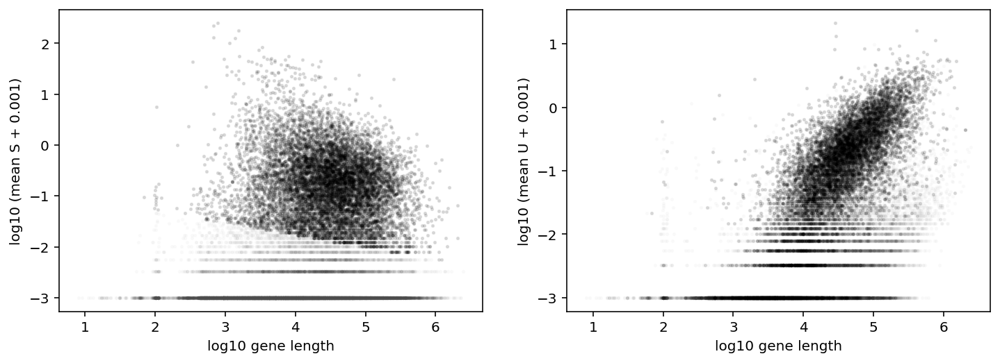

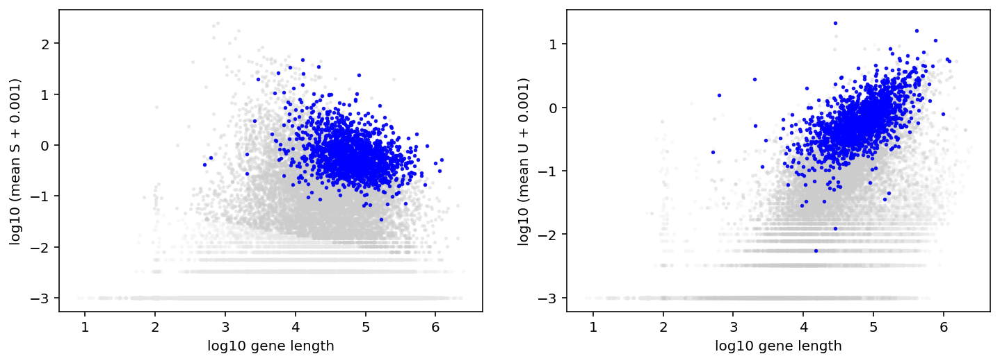

In [15]:
for i in range(0,len(perturb_looms)):
    inference_workflow(perturb_looms[i]+'_input.txt')

### **Assess best sampling parameters with chi-squared rejection of genes**
Using a chi-squared test reject genes with poor fits and determine the best sampling and physical parameters upon removal of these genes

In [16]:
outputs = glob.glob(data_path+proj_fold+out_fold+creator+'_'+override+'_*1x1*/result.pickle')

In [17]:
out_names = [get_name(i,iden="_1x1") for i in outputs]
out_names

['crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b',
 'crisprsgHUS1_2a_sgNegCtrl3b',
 'crisprsgNegCtrl4a_sgNegCtrl3b',
 'crisprsgNegCtrl02093a_sgFDPS_2b',
 'crisprsgHUS1_2a_sgFDPS_2b',
 'crisprsgNegCtrl02093a_sgNegCtrl3b',
 'crisprsgNegCtrl5a_sgNegCtrl3b',
 'crisprsgNegCtrl9a_sgNegCtrl3b',
 'crisprsgNegCtrl1a_sgNegCtrl3b',
 'crisprsgNegCtrl8a_sgNegCtrl3b']

In [18]:
#Read in outputs
results = []
for i in outputs:
     results += [import_datasets([i])]

results[0].raw_S.shape

(1595, 4563)

#### **Do chi-squared correction (reject genes with bad fits) and re-evaluate best params**

In [19]:
#Run chisq, set rejected genes

#Set some optimal samp params before chisq
for i in range(0,len(results)):
    results[i].find_best_params() 
    print(results[i].best_samp_params)
 

(-6.894736842105264, -1.525)
(-6.894736842105264, -1.525)
(-6.894736842105264, -1.525)
(-6.894736842105264, -1.525)
(-6.894736842105264, -1.525)
(-6.894736842105264, -1.525)
(-6.894736842105264, -1.525)
(-6.894736842105264, -1.525)
(-6.894736842105264, -1.525)
(-6.894736842105264, -1.525)


In [20]:
#Run chisq, set rejected genes
 
for i in range(0,len(results)):
    print(i)
    chisq_gen(results[i],EPS=1e-20) #1e-12 too large --> numerical discrepancies b/w obs vs expect freqs
    compute_sigma(results[i])
    chisq_best_param_correction(results[i],overwrite=True,EPS=1e-20,viz=False) #Copy github and change params

0


/home/tchari/perturbCME/notebooks/seq_cme_inference.py:382: RuntimeWarning: invalid value encountered in sqrt
  errorbars[i,:] = c*np.sqrt(np.diag(hess_inv))/np.sqrt(result_data.Ncells)


Parameter set 30 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 579 gives negative stdev; replaced with mean. (Search converged to local minimum?)
1


/home/tchari/perturbCME/notebooks/seq_cme_inference.py:382: RuntimeWarning: invalid value encountered in sqrt
  errorbars[i,:] = c*np.sqrt(np.diag(hess_inv))/np.sqrt(result_data.Ncells)


Parameter set 290 gives negative stdev; replaced with mean. (Search converged to local minimum?)
2


/home/tchari/perturbCME/notebooks/seq_cme_inference.py:382: RuntimeWarning: invalid value encountered in sqrt
  errorbars[i,:] = c*np.sqrt(np.diag(hess_inv))/np.sqrt(result_data.Ncells)


Parameter set 995 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 1265 gives negative stdev; replaced with mean. (Search converged to local minimum?)
3


/home/tchari/perturbCME/notebooks/seq_cme_inference.py:382: RuntimeWarning: invalid value encountered in sqrt
  errorbars[i,:] = c*np.sqrt(np.diag(hess_inv))/np.sqrt(result_data.Ncells)


Parameter set 22 gives negative stdev; replaced with mean. (Search converged to local minimum?)
4


/home/tchari/perturbCME/notebooks/seq_cme_inference.py:382: RuntimeWarning: invalid value encountered in sqrt
  errorbars[i,:] = c*np.sqrt(np.diag(hess_inv))/np.sqrt(result_data.Ncells)


Parameter set 1332 gives negative stdev; replaced with mean. (Search converged to local minimum?)
5


/home/tchari/perturbCME/notebooks/seq_cme_inference.py:382: RuntimeWarning: invalid value encountered in sqrt
  errorbars[i,:] = c*np.sqrt(np.diag(hess_inv))/np.sqrt(result_data.Ncells)


Parameter set 1350 gives negative stdev; replaced with mean. (Search converged to local minimum?)
6


/home/tchari/perturbCME/notebooks/seq_cme_inference.py:382: RuntimeWarning: invalid value encountered in sqrt
  errorbars[i,:] = c*np.sqrt(np.diag(hess_inv))/np.sqrt(result_data.Ncells)


Parameter set 667 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 776 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 902 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 1003 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 1140 ran into singularity; replaced with mean. (Search converged to local minimum?) 
7


/home/tchari/perturbCME/notebooks/seq_cme_inference.py:382: RuntimeWarning: invalid value encountered in sqrt
  errorbars[i,:] = c*np.sqrt(np.diag(hess_inv))/np.sqrt(result_data.Ncells)


Parameter set 249 gives negative stdev; replaced with mean. (Search converged to local minimum?)
8


/home/tchari/perturbCME/notebooks/seq_cme_inference.py:382: RuntimeWarning: invalid value encountered in sqrt
  errorbars[i,:] = c*np.sqrt(np.diag(hess_inv))/np.sqrt(result_data.Ncells)


Parameter set 406 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 608 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 892 ran into singularity; replaced with mean. (Search converged to local minimum?) 
Parameter set 1140 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 1236 ran into singularity; replaced with mean. (Search converged to local minimum?) 
Parameter set 1316 gives negative stdev; replaced with mean. (Search converged to local minimum?)
9


/home/tchari/perturbCME/notebooks/seq_cme_inference.py:382: RuntimeWarning: invalid value encountered in sqrt
  errorbars[i,:] = c*np.sqrt(np.diag(hess_inv))/np.sqrt(result_data.Ncells)


Parameter set 822 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 986 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 1290 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 1301 gives negative stdev; replaced with mean. (Search converged to local minimum?)


In [21]:
for i in range(0,len(results)): 
    print(out_names[i] + ' New params: ', results[i].best_samp_params)
    perc = np.round(np.sum(results[i].gene_rej)/results[i].n_gen,3)*100
    print(out_names[i]+': '+str(np.sum(results[i].gene_rej))+' genes of '+str(results[i].n_gen)+' ('+ str(perc)+'%) have been rejected by chi-square.')
    print()

crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b New params:  (-6.894736842105264, -1.525)
crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b: 160 genes of 1595 (10.0%) have been rejected by chi-square.

crisprsgHUS1_2a_sgNegCtrl3b New params:  (-6.894736842105264, -1.525)
crisprsgHUS1_2a_sgNegCtrl3b: 40 genes of 1595 (2.5%) have been rejected by chi-square.

crisprsgNegCtrl4a_sgNegCtrl3b New params:  (-6.894736842105264, -1.525)
crisprsgNegCtrl4a_sgNegCtrl3b: 26 genes of 1595 (1.6%) have been rejected by chi-square.

crisprsgNegCtrl02093a_sgFDPS_2b New params:  (-6.894736842105264, -1.525)
crisprsgNegCtrl02093a_sgFDPS_2b: 31 genes of 1595 (1.9%) have been rejected by chi-square.

crisprsgHUS1_2a_sgFDPS_2b New params:  (-6.894736842105264, -1.525)
crisprsgHUS1_2a_sgFDPS_2b: 36 gene

#### **Look at parameters fits**

crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b
crisprsgHUS1_2a_sgNegCtrl3b
crisprsgNegCtrl4a_sgNegCtrl3b
crisprsgNegCtrl02093a_sgFDPS_2b
crisprsgHUS1_2a_sgFDPS_2b
crisprsgNegCtrl02093a_sgNegCtrl3b
crisprsgNegCtrl5a_sgNegCtrl3b
crisprsgNegCtrl9a_sgNegCtrl3b
crisprsgNegCtrl1a_sgNegCtrl3b
crisprsgNegCtrl8a_sgNegCtrl3b


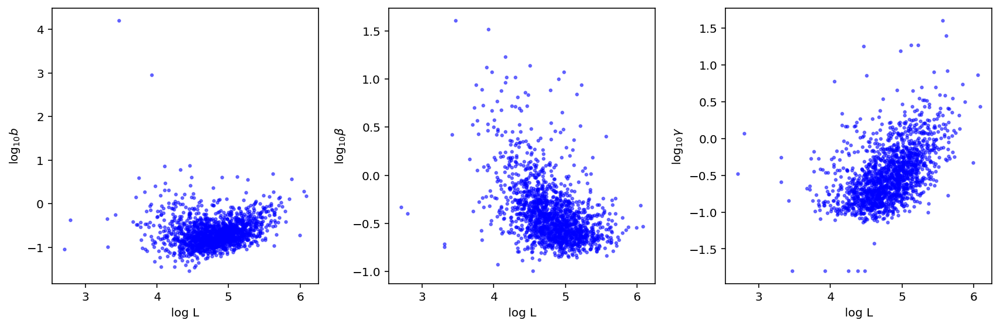

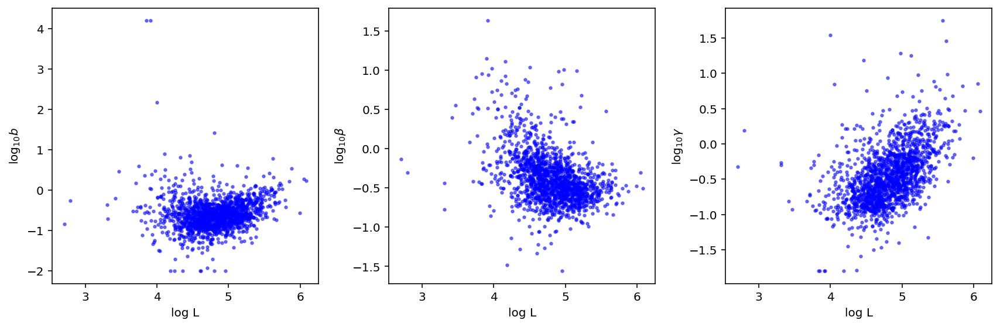

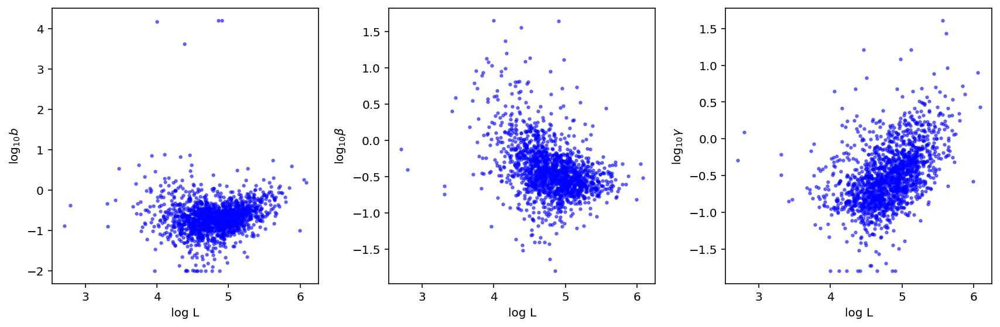

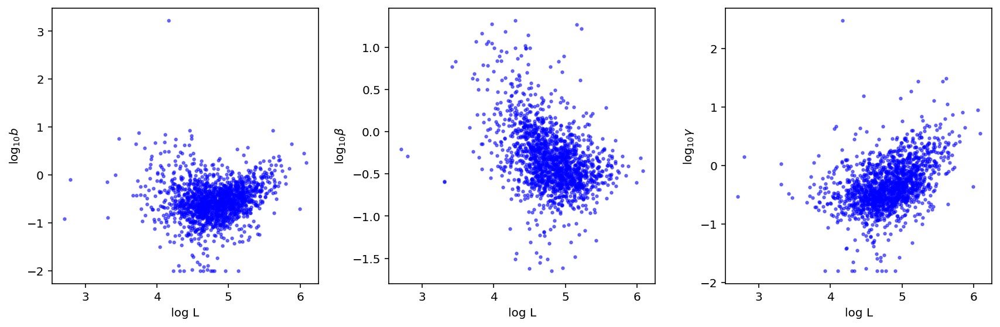

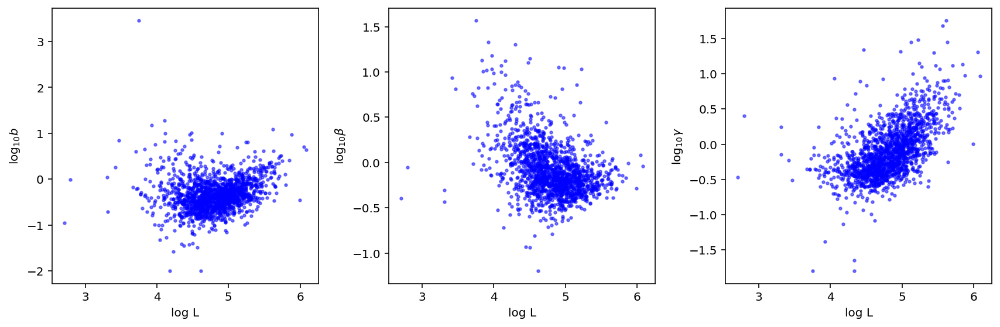

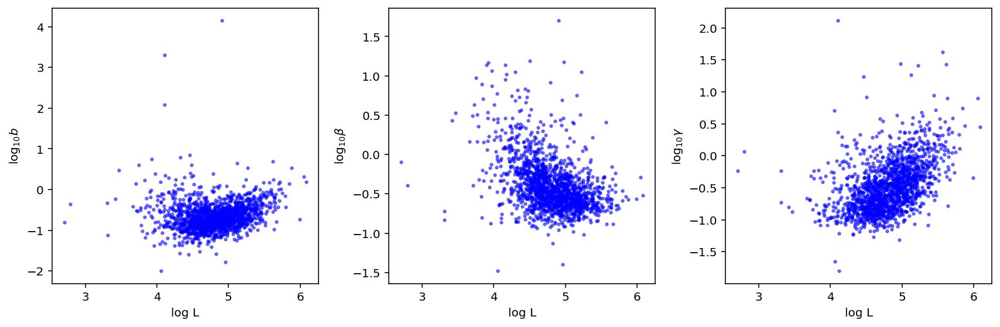

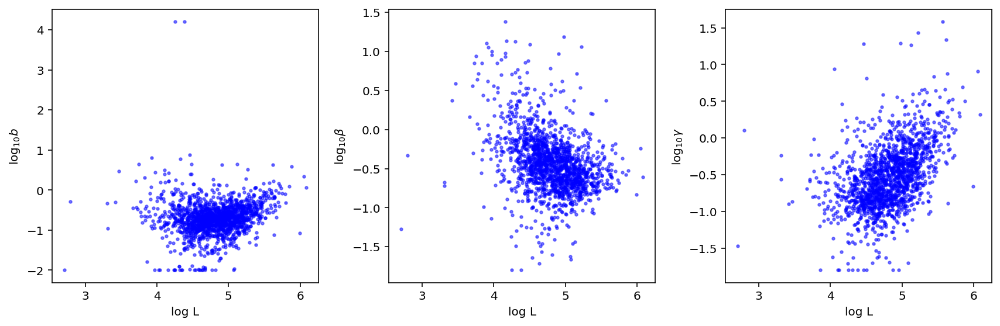

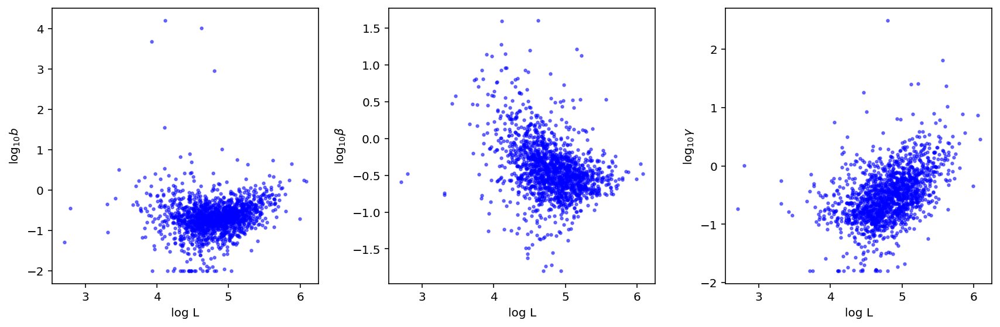

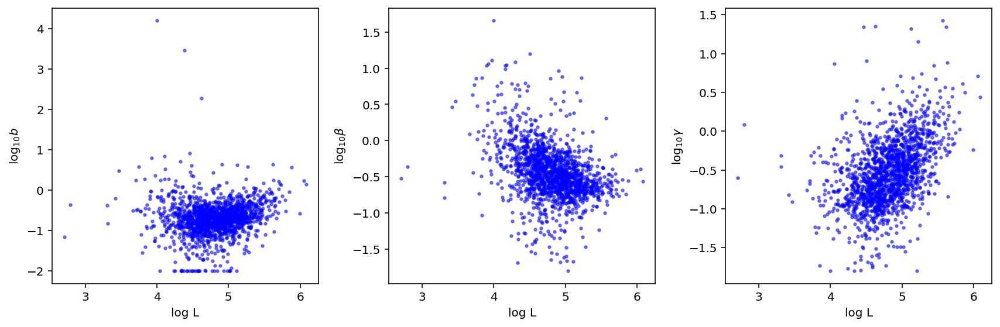

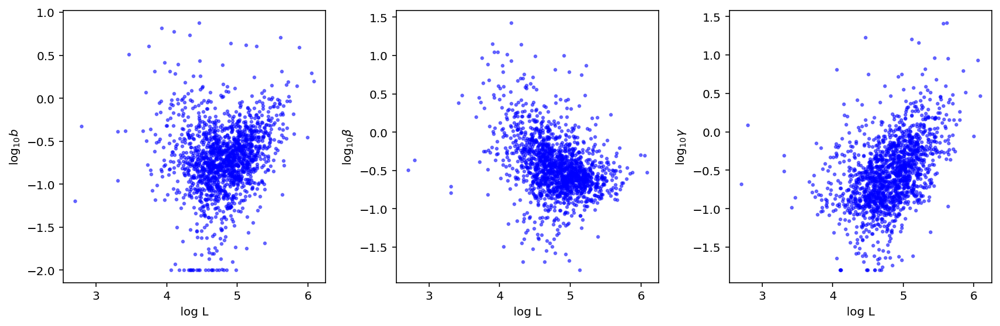

In [22]:
for i in range(0,len(results)):
    print(out_names[i])
    plot_param_L_dep(results[i],plot_errorbars=False,nosamp=True,chisq_correct=False)  #May see length dependence

crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b
crisprsgHUS1_2a_sgNegCtrl3b
crisprsgNegCtrl4a_sgNegCtrl3b
crisprsgNegCtrl02093a_sgFDPS_2b
crisprsgHUS1_2a_sgFDPS_2b
crisprsgNegCtrl02093a_sgNegCtrl3b
crisprsgNegCtrl5a_sgNegCtrl3b
crisprsgNegCtrl9a_sgNegCtrl3b
crisprsgNegCtrl1a_sgNegCtrl3b
crisprsgNegCtrl8a_sgNegCtrl3b


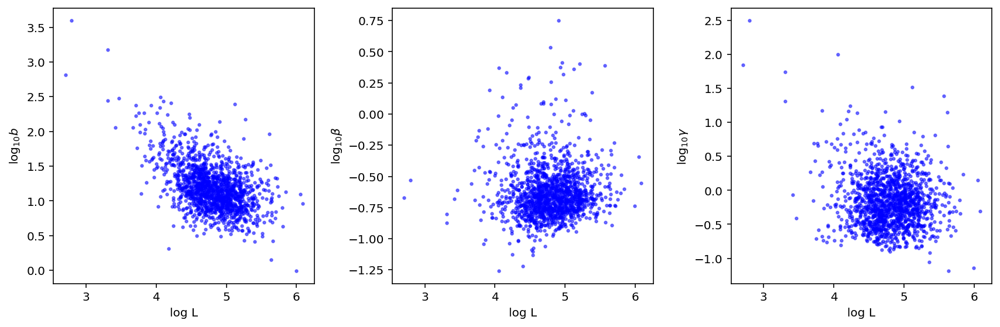

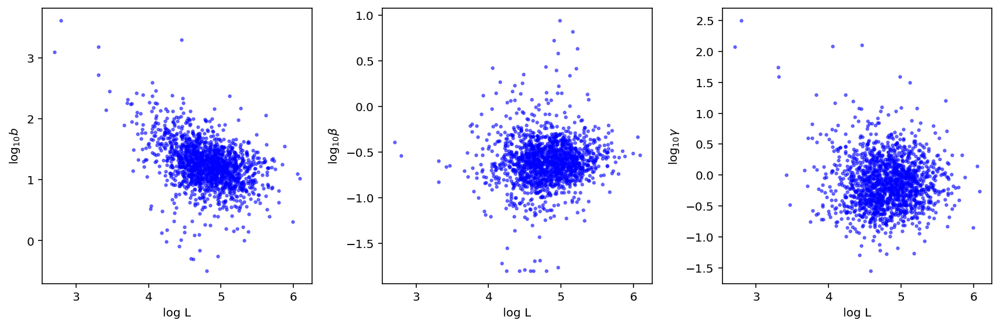

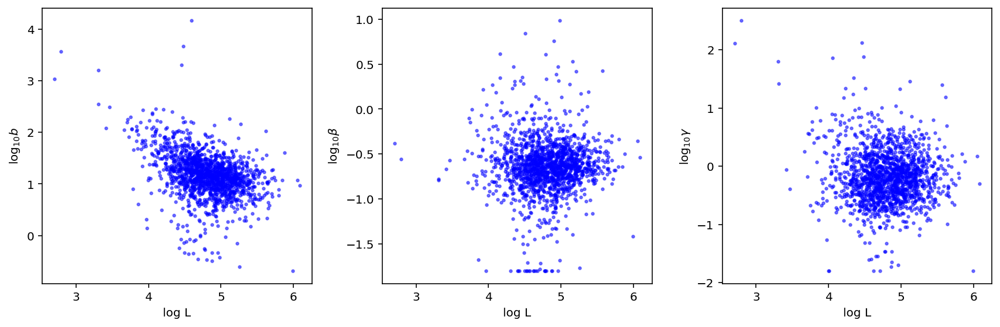

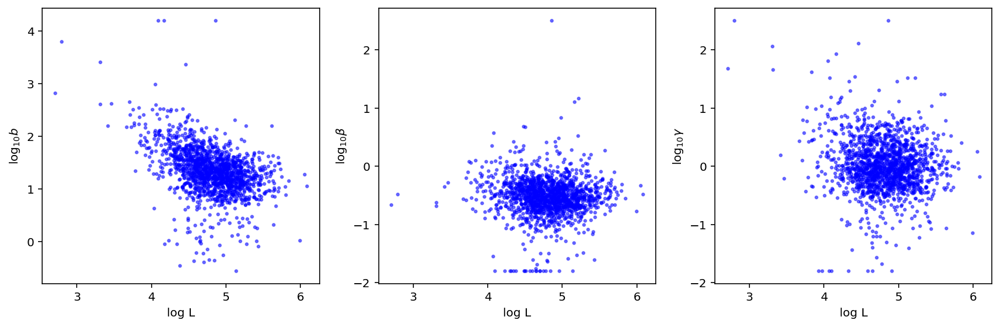

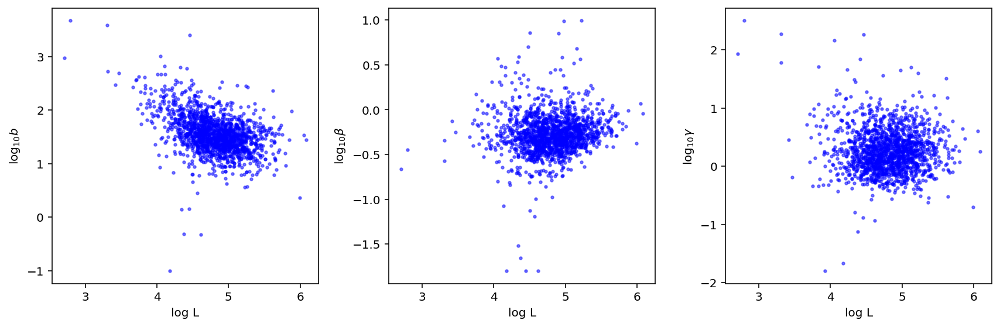

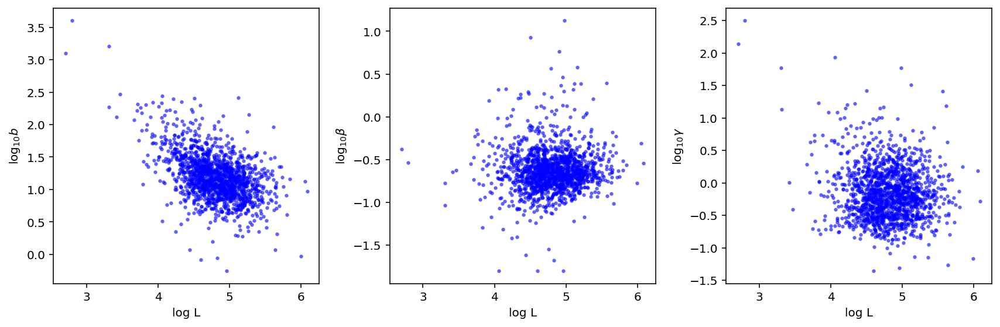

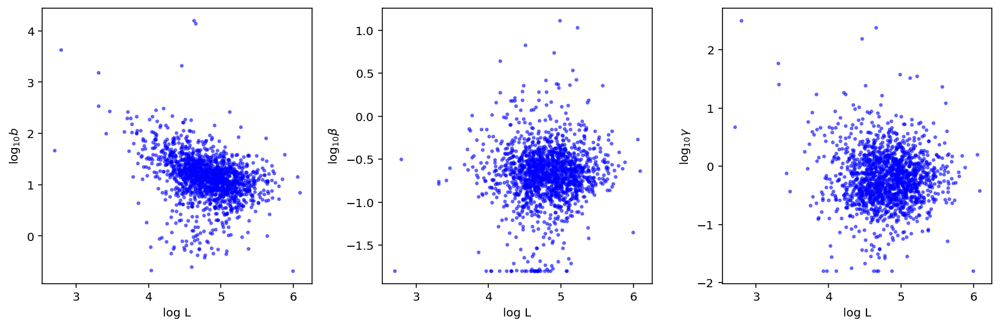

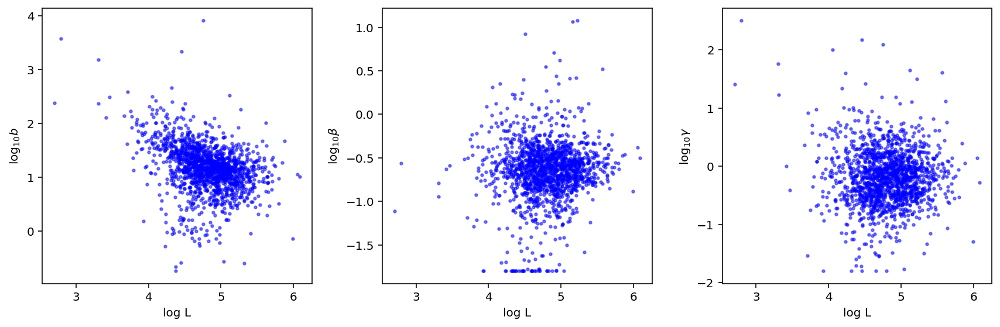

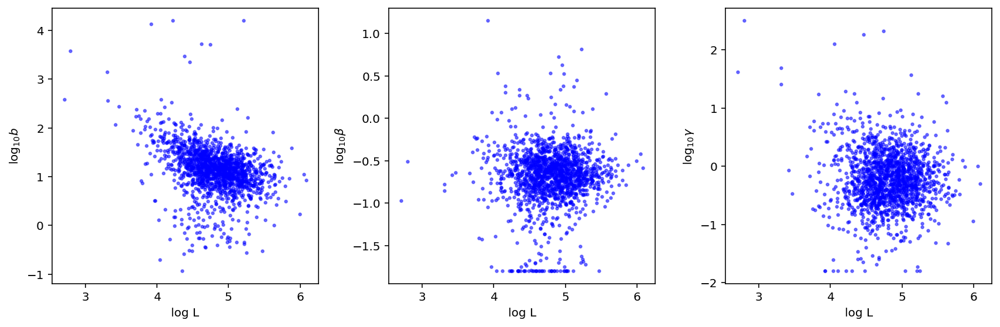

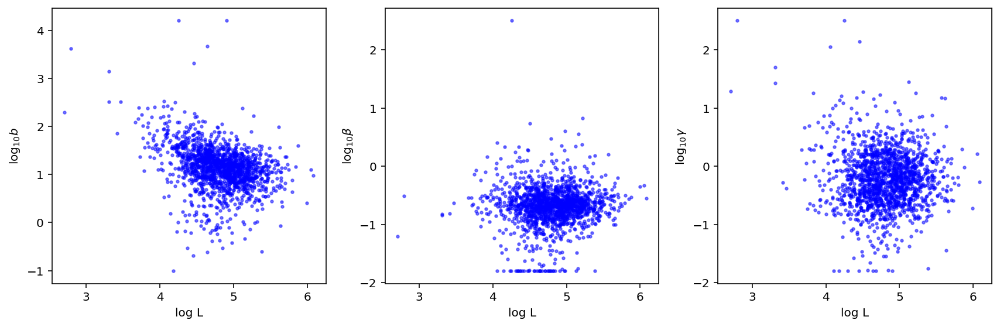

In [23]:
for i in range(0,len(results)):
    print(out_names[i])
    plot_param_L_dep(results[i],plot_errorbars=False)  #chisq_correct=False
    #Should not see length dep (besides burst size)

In [24]:
#Get errors at end of optimization routine

for i in range(0,len(results)):
    print(str(i)+' '+out_names[i]+' avg KL: '+str(np.mean(results[i].gene_spec_err[results[i].best_ind])))


0 crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b avg KL: 0.00866591182104815
1 crisprsgHUS1_2a_sgNegCtrl3b avg KL: 0.027409717393009795
2 crisprsgNegCtrl4a_sgNegCtrl3b avg KL: 0.03152500849956401
3 crisprsgNegCtrl02093a_sgFDPS_2b avg KL: 0.05133411299675337
4 crisprsgHUS1_2a_sgFDPS_2b avg KL: 0.03399764359787967
5 crisprsgNegCtrl02093a_sgNegCtrl3b avg KL: 0.018806950605217896
6 crisprsgNegCtrl5a_sgNegCtrl3b avg KL: 0.03620912790776938
7 crisprsgNegCtrl9a_sgNegCtrl3b avg KL: 0.03892666623656415
8 crisprsgNegCtrl1a_sgNegCtrl3b avg KL: 0.04114624002183528
9 crisprsgNegCtrl8a_sgNegCtrl3b avg KL: 0.03947191675257443


## **Assess correlation of Sample Fits**

In [25]:
c_highlight = col_red
c1 = [173/255,214/255,200/255]
c2 = [59/255,131/255,130/255]
ncol=20
cmap = ListedColormap(np.array([np.linspace(c2[j],c1[j],ncol) for j in range(3)]).T)

In [26]:
rep_pairs = []

for i in range(len(results)):
    rep_pairs += [(i,6)]

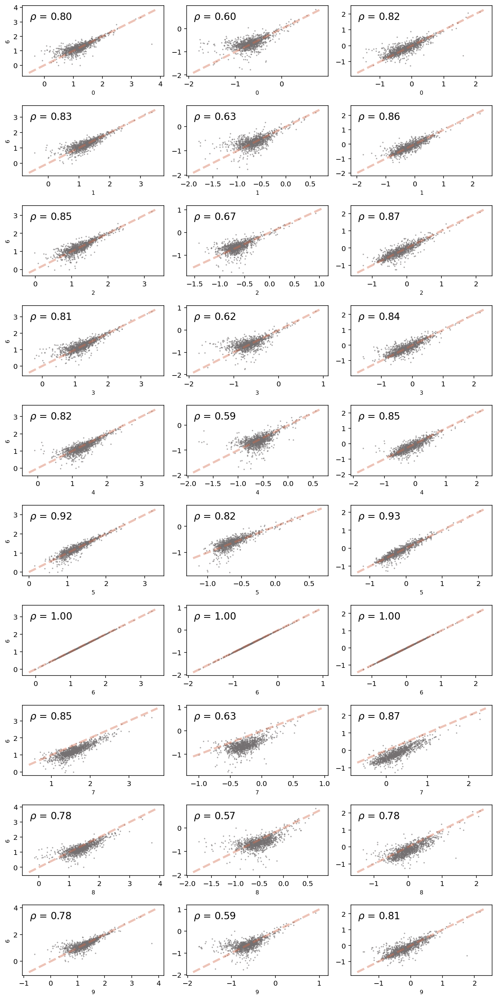

In [117]:
ms,lw,ms_fail,alf,alf_fail = sifig_aesth
fig1, ax1 = plt.subplots(nrows=len(rep_pairs),ncols=3,figsize=(10,20))
nbin=30
for i in range(len(rep_pairs)):
    K = rep_pairs[i]
    #print(looms[K[0]])
    res1 = results[K[0]]#import_precomputed_(results[K[0]])


    #print(looms[K[1]])
    res2 = results[K[1]]#import_precomputed_(results[K[1]])
    #chisq_gen(res2)

    err1 = res1.sigma*2.576
    err2 = res2.sigma*2.576


    for j in range(3):

        filt = ~res1.gene_rej & ~res2.gene_rej \
            & ~check_at_bounds(res1,res1.best_phys_params)\
            & ~check_at_bounds(res2,res2.best_phys_params)
        
#         ax1[i,j].errorbar(res1.best_phys_params[filt,j],
#             res2.best_phys_params[filt,j],
#             err1[filt,j],err2[filt,j],marker=markerstyle,ms=ms,c=col_gold,alpha=alf,linestyle='None',linewidth=lw,zorder=-100)

    
        ax1[i,j].scatter(res1.best_phys_params[filt,j],
                   res2.best_phys_params[filt,j],color=col_gray,alpha=alf_fail,s=ms_fail)
    
        #print(res1.best_phys_params[filt,j].shape)


        fs=14
        sml=8
        rho=np.corrcoef(res1.best_phys_params[filt,j],res2.best_phys_params[filt,j])[0][1]
        xl = ax1[i,j].get_xlim()
        ax1[i,j].plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)
        ax1[i,j].set_xlabel(str(K[0]),fontsize=sml)

        if j==0:
            ax1[i,j].set_ylabel(str(K[1]),fontsize=sml)
        ax1[i,j].text(.05,.8,r'$\rho$ = {:.2f}'.format(rho),fontsize=fs,transform=ax1[i,j].transAxes)

fig1.tight_layout()
fig1.show()

In [49]:
for i in range(len(results)):
    print(str(i),': ',out_names[i])

0 :  crisprsgNegCtrl8a_sgNegCtrl3b
1 :  crisprsgNegCtrl1a_sgNegCtrl3b
2 :  crisprsgNegCtrl02093a_sgNegCtrl3b
3 :  crisprsgNegCtrl5a_sgNegCtrl3b
4 :  crisprsgHUS1_2a_sgNegCtrl3b
5 :  crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b
6 :  crisprsgNegCtrl4a_sgNegCtrl3b
7 :  crisprsgHUS1_2a_sgFDPS_2b
8 :  crisprsgNegCtrl02093a_sgFDPS_2b
9 :  crisprsgNegCtrl9a_sgNegCtrl3b


## **Identify Highly Perturbed Genes**
Extract genes with large deviations from the identity line and compare to genes from the study (Replogle et al 2020)

### **Plot of correlations for DE genes from study**

In [27]:
pub_meta = pd.read_csv('~/metadata/Figure2g.csv')
pub_meta.head()

,Unnamed: 0,ENO1,PRDX1,SERBP1,FDPS,MAT2A,HSPD1,HSPE1,NCL,PTMA,...,RPS9,RANBP1,RP11-717F1.1,MT-ND1,MT-ND2,MT-CO2,MT-ATP6,MT-CO3,MT-ND3,MT-ND6
0,sgHUS1_2a / sgNegCtrl3b,-0.130356,0.002753,-0.148872,-0.040777,-0.029393,-0.047759,-0.093335,-0.117664,-0.140321,...,0.080245,-0.171497,0.159400,0.110976,-0.006594,0.189993,0.013471,0.228624,0.079783,0.037100
1,sgNegCtrl02093a / sgFDPS_2b,-0.899808,-0.929240,-0.758381,-1.122561,0.929940,-0.963508,-0.965116,-0.986381,-1.003163,...,-0.438863,-0.920145,1.383138,-0.305622,-0.315941,-0.545940,-0.814887,-0.683995,-0.391950,-0.722684
2,sgHUS1_2a / sgFDPS_2b,-0.819117,-0.426150,-0.775788,-1.031531,0.037011,-0.827004,-0.900423,-0.821474,-0.736823,...,0.536981,-0.970679,0.859665,-0.245880,-0.312901,-0.332194,-0.619101,-0.571243,-0.332377,-0.487206
3,model prediction,-0.669642,-0.524990,-0.611683,-0.687682,0.493089,-0.605716,-0.661888,-0.703476,-0.740488,...,-0.152228,-0.731086,0.979659,-0.039212,-0.187626,-0.080044,-0.446978,-0.111698,-0.126116,-0.365907
4,difference,-0.149475,0.098840,-0.164105,-0.343849,-0.456078,-0.221288,-0.238535,-0.117998,0.003665,...,0.689208,-0.239593,-0.119994,-0.206668,-0.125275,-0.252150,-0.172123,-0.459545,-0.206262,-0.121299


In [28]:
print(len(results[0].gene_names))

1595


In [29]:
# remain = np.array(results[0].gene_names)[~results[0].gene_rej & ~check_at_bounds(results[0],results[0].best_phys_params)]


In [30]:
names = pub_meta.columns.tolist()[1:]
print(len(names))

50


In [31]:
len(results[0].gene_names)

1595

In [32]:
gnames = [i for i in names if i in results[0].gene_names]
len(gnames)

12

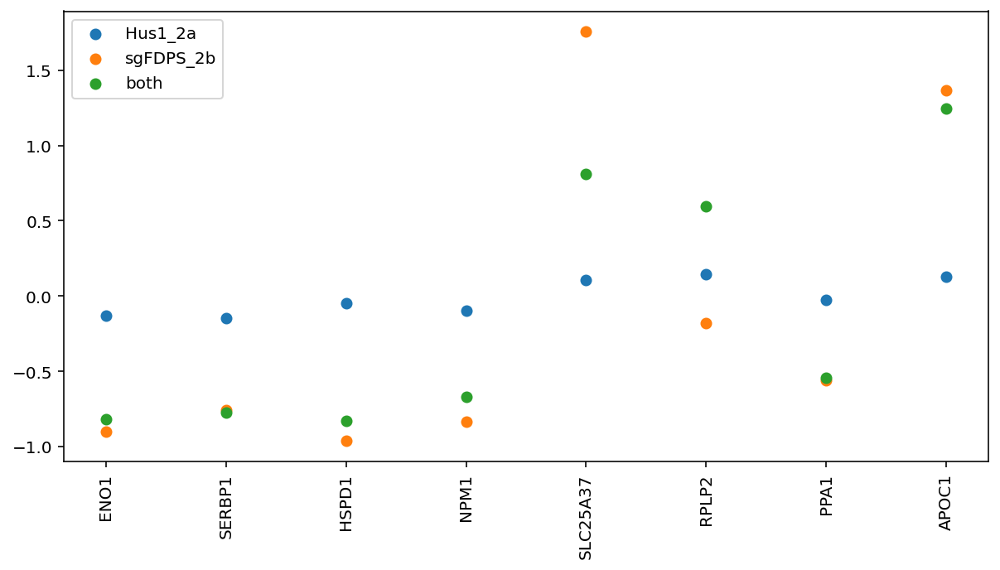

In [57]:
#Plot DE genes z-scored expression (names in selected genes)

hus = np.array(pub_meta[gnames])[0,:]
sgFDPS = np.array(pub_meta[gnames])[1,:]
both = np.array(pub_meta[gnames])[2,:]

plt.figure(figsize=(10,5))
plt.scatter(gnames,hus,label='Hus1_2a')
plt.scatter(gnames,sgFDPS,label='sgFDPS_2b')
plt.scatter(gnames,both,label='both')
plt.xticks(rotation=90)
plt.legend()
plt.show()


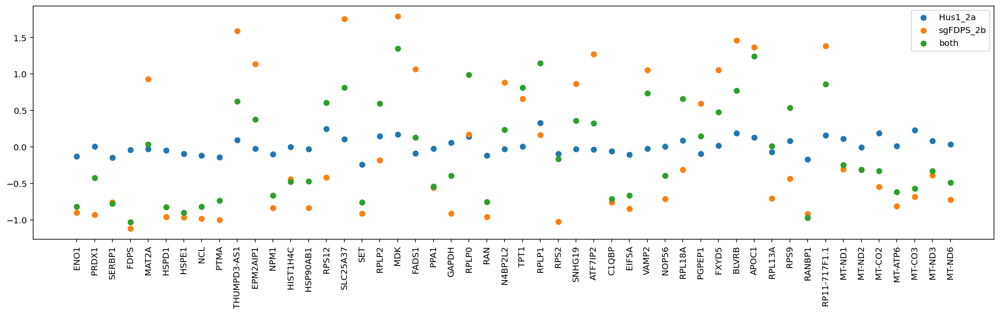

In [58]:
#Plot DE genes z-scored expression (all DE genes from study)

hus = np.array(pub_meta[names])[0,:]
sgFDPS = np.array(pub_meta[names])[1,:]
both = np.array(pub_meta[names])[2,:]

plt.figure(figsize=(20,5))
plt.scatter(names,hus,label='Hus1_2a')
plt.scatter(names,sgFDPS,label='sgFDPS_2b')
plt.scatter(names,both,label='both')
plt.xticks(rotation=90)
plt.legend()
plt.show()


In [61]:
#Plot parameters/correlations for DE genes from study

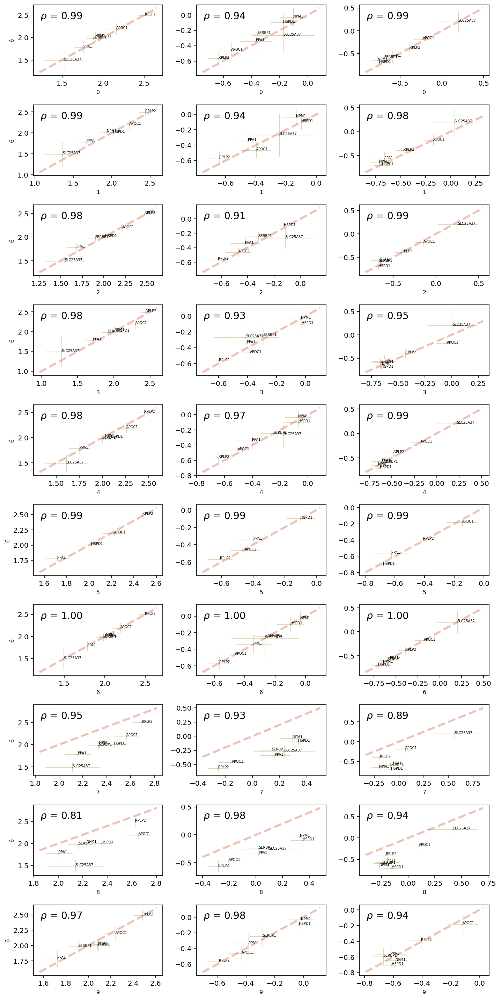

In [114]:

ms,lw,ms_fail,alf,alf_fail = sifig_aesth
fig1, ax1 = plt.subplots(nrows=len(rep_pairs),ncols=3,figsize=(10,20))
nbin=30
for i in range(len(rep_pairs)):
    K = rep_pairs[i]
    #print(looms[K[0]])
    res1 = results[K[0]]#import_precomputed_(results[K[0]])


    #print(looms[K[1]])
    res2 = results[K[1]]#import_precomputed_(results[K[1]])
    #chisq_gen(res2)

    err1 = res1.sigma*2.576
    err2 = res2.sigma*2.576


    for j in range(3):

        
        filt = ~res1.gene_rej & ~res2.gene_rej \
        & ~check_at_bounds(res1,res1.best_phys_params)\
        & ~check_at_bounds(res2,res2.best_phys_params) \
        & pd.Categorical(res1.gene_names).isin(names) #Add filter for DE genes from study
        
        ax1[i,j].errorbar(res1.best_phys_params[filt,j],
            res2.best_phys_params[filt,j],
            err1[filt,j],err2[filt,j],marker=markerstyle,ms=ms,c=col_gold,alpha=0.7,linestyle='None',linewidth=lw,zorder=-100)

    
        ax1[i,j].scatter(res1.best_phys_params[filt,j],
                   res2.best_phys_params[filt,j],color=col_gray,alpha=alf_fail,s=ms_fail)
    

    
        n = np.array(res1.gene_names)[filt]
        for p, txt in enumerate(n):
            ax1[i,j].annotate(txt, (res1.best_phys_params[filt,j][p],res2.best_phys_params[filt,j][p]),
                             fontsize=5)
    

        
        fs=14
        sml=8
        rho=np.corrcoef(res1.best_phys_params[filt,j],res2.best_phys_params[filt,j])[0][1]
        xl = ax1[i,j].get_xlim()
        ax1[i,j].plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)
        ax1[i,j].set_xlabel(str(K[0]),fontsize=sml)

        if j==0:
            ax1[i,j].set_ylabel(str(K[1]),fontsize=sml)
        ax1[i,j].text(.05,.8,r'$\rho$ = {:.2f}'.format(rho),fontsize=fs,transform=ax1[i,j].transAxes)

fig1.tight_layout()
fig1.show()

In [33]:
for i in range(len(results)):
    print(str(i),': ',out_names[i])

0 :  crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b
1 :  crisprsgHUS1_2a_sgNegCtrl3b
2 :  crisprsgNegCtrl4a_sgNegCtrl3b
3 :  crisprsgNegCtrl02093a_sgFDPS_2b
4 :  crisprsgHUS1_2a_sgFDPS_2b
5 :  crisprsgNegCtrl02093a_sgNegCtrl3b
6 :  crisprsgNegCtrl5a_sgNegCtrl3b
7 :  crisprsgNegCtrl9a_sgNegCtrl3b
8 :  crisprsgNegCtrl1a_sgNegCtrl3b
9 :  crisprsgNegCtrl8a_sgNegCtrl3b


## **Test log-additive/multiplicative prediction model**

In [ ]:
# z-CTRL = a-CTRL + b-CTRL where z=log(param_ab), a=log(param_a),b=log(param_b), CTRL=log(param_CTRL)
#Assuming fold changes have cumulative effect

### **Fit model across genes and parameters**

In [46]:
#Define result objects for each gRNA sample
hus_res = results[1]
sg_res = results[3]
both_res = results[4]
ctrl_res = results[3]


filt = ~hus_res.gene_rej & ~sg_res.gene_rej & ~both_res.gene_rej & ~ctrl_res.gene_rej \
& ~check_at_bounds(hus_res,hus_res.best_phys_params)\
& ~check_at_bounds(sg_res,sg_res.best_phys_params) \
& ~check_at_bounds(both_res,both_res.best_phys_params) \
& ~check_at_bounds(ctrl_res,ctrl_res.best_phys_params) 

#



filtDE = pd.Categorical(np.array(hus_res.gene_names)[filt]).isin(names)




**Run Model**

In [47]:
#MODEL

z = (hus_res.best_phys_params[filt,:] - ctrl_res.best_phys_params[filt,:]) 
+ (sg_res.best_phys_params[filt,:] - ctrl_res.best_phys_params[filt,:])

#Get previously fit parameter vaues,'ground truth'
true = (both_res.best_phys_params[filt,:] - ctrl_res.best_phys_params[filt,:])

In [48]:
z.shape

(1464, 3)

### **Plot Predicted FCs Correlations to Fit FCs**
See if predicted fold changes (FC) match up

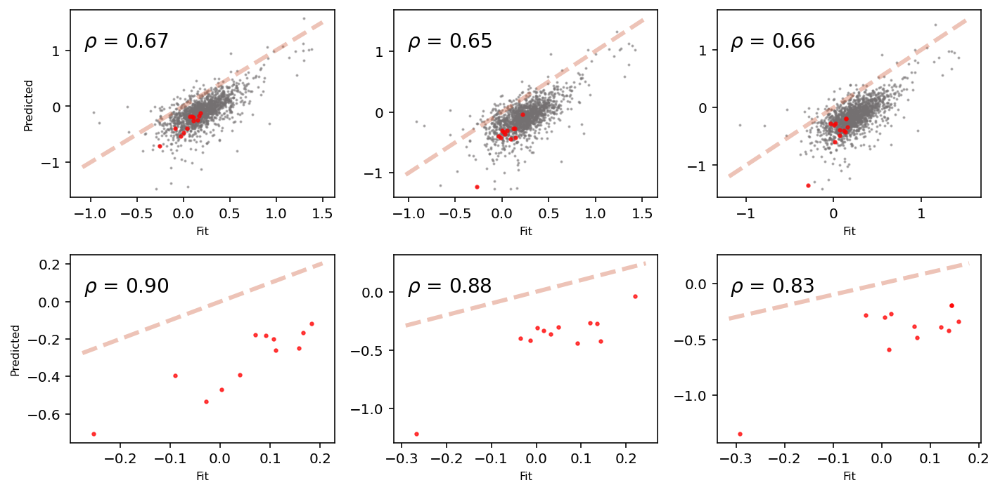

In [49]:

ms,lw,ms_fail,alf,alf_fail = sifig_aesth
fig1, ax1 = plt.subplots(nrows=2,ncols=3,figsize=(10,5))
nbin=30

i=0
for j in range(3):


#         ax1[i,j].errorbar(res1.best_phys_params[filt,j],
#             res2.best_phys_params[filt,j],
#             err1[filt,j],err2[filt,j],marker=markerstyle,ms=ms,c=col_gold,alpha=alf,linestyle='None',linewidth=lw,zorder=-100)


    ax1[i,j].scatter(true[:,j],z[:,j],color=col_gray,alpha=alf_fail,s=ms_fail)

    filtNames = np.array(hus_res.gene_names)[filt]
    n = filtNames[filtDE]
    for p, txt in enumerate(n):
#         ax1[i,j].annotate(txt, (z[filtDE,j][p],true[filtDE,j][p]),
#                          fontsize=5)
        
        ax1[i,j].scatter(true[filtDE,j][p],z[filtDE,j][p],color='red',alpha=0.7,s=5)



    fs=14
    sml=8
    rho=np.corrcoef(z[:,j],true[:,j])[0][1]
    xl = ax1[i,j].get_xlim()
    ax1[i,j].plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)
    ax1[i,j].set_xlabel('Fit',fontsize=sml)

    if j==0:
        ax1[i,j].set_ylabel('Predicted',fontsize=sml)
    ax1[i,j].text(.05,.8,r'$\rho$ = {:.2f}'.format(rho),fontsize=fs,transform=ax1[i,j].transAxes)
    
    
    #bottom plot
    ax1[i+1,j].scatter(true[filtDE,j],z[filtDE,j],color='red',alpha=0.7,s=5)
    
    fs=14
    sml=8
    rho=np.corrcoef(z[filtDE,j],true[filtDE,j])[0][1]
    xl = ax1[i+1,j].get_xlim()
    ax1[i+1,j].plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)
    ax1[i+1,j].set_xlabel('Fit',fontsize=sml)

    if j==0:
        ax1[i+1,j].set_ylabel('Predicted',fontsize=sml)
    ax1[i+1,j].text(.05,.8,r'$\rho$ = {:.2f}'.format(rho),fontsize=fs,transform=ax1[i+1,j].transAxes)


fig1.tight_layout()
fig1.show()

### **Plot predicted parameter values vs control parameters**

Highlight known DE genes

In [99]:
#Params in log10

predParams = z + ctrl_res.best_phys_params[filt,:]

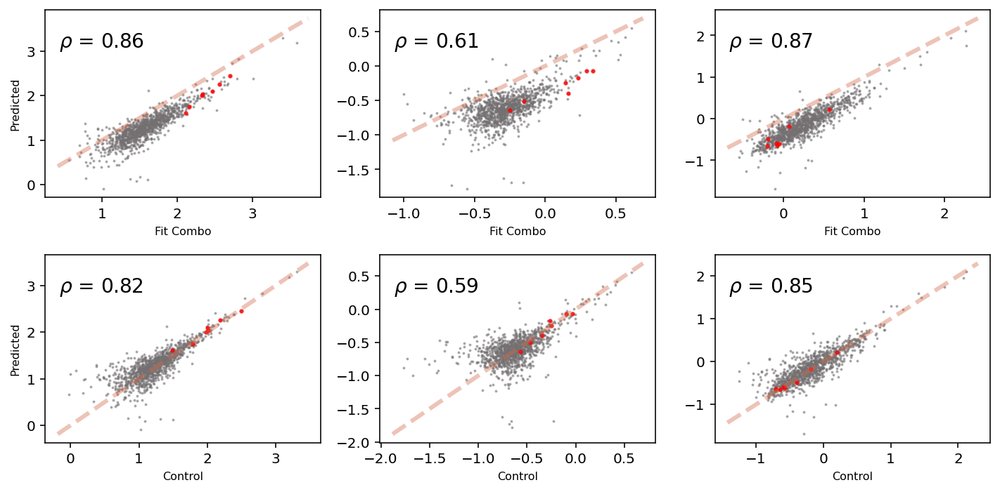

In [107]:

ms,lw,ms_fail,alf,alf_fail = sifig_aesth
fig1, ax1 = plt.subplots(nrows=2,ncols=3,figsize=(10,5))
nbin=30


res = [both_res,ctrl_res]
ns = ['Fit Combo','Control']

for i in range(len(res)):
    r = res[i]
    
    for j in range(3):
        


    #         ax1[i,j].errorbar(res1.best_phys_params[filt,j],
    #             res2.best_phys_params[filt,j],
    #             err1[filt,j],err2[filt,j],marker=markerstyle,ms=ms,c=col_gold,alpha=alf,linestyle='None',linewidth=lw,zorder=-100)


        ax1[i,j].scatter(r.best_phys_params[filt,j],predParams[:,j],color=col_gray,alpha=alf_fail,s=ms_fail)

    #     filtNames = np.array(hus_res.gene_names)[filt]
    #     n = filtNames[filtDE]

        physParams = r.best_phys_params[filt,:]
        ax1[i,j].scatter(physParams[filtDE,j],predParams[filtDE,j],color='red',alpha=0.7,s=5)
        
    #     for p, txt in enumerate(n):
    #         ax1[i,j].annotate(txt, (physParams[filtDE,j][p],predParams[filtDE,j][p]),
    #                          fontsize=5)



        fs=14
        sml=8
        rho=np.corrcoef(r.best_phys_params[filt,j],predParams[:,j])[0][1]
        xl = ax1[i,j].get_xlim()
        ax1[i,j].plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)
        ax1[i,j].set_xlabel(ns[i],fontsize=sml)

        if j==0:
            ax1[i,j].set_ylabel('Predicted',fontsize=sml)
        ax1[i,j].text(.05,.8,r'$\rho$ = {:.2f}'.format(rho),fontsize=fs,transform=ax1[i,j].transAxes)

fig1.tight_layout()
fig1.show()